---

<font color='purple'>Purple $\Rightarrow$ Autoencoder</font>


<font color = 'blue'> Blue $\Rightarrow$ Variational Autoencoder </font>

<font color = 'red'>Red $\Rightarrow$ Gaussian Mixed Variational Autoencoder</font>


---

---

# Library 

---

In [1]:
#--- Library Needed ---#
#--- Data ---#
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#--- Single Cell ---#
import anndata
import scanpy as sc 
from scanpy import AnnData
#--- Machine Learning ---#
from sklearn.model_selection import train_test_split
from sklearn.metrics import adjusted_rand_score
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras import layers, Model

/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


---

# Load in the Data and Prepare for Training

---

In [2]:
#---Load in the data---#
path = '/Users/huntercarroll/Desktop/Desktop - Hunter’s MacBook Air/UCLA/DATA/Copy of adult_PFC_05302023.h5ad'
adata = sc.read(path)
#---Rank Gene Groups by leiden using the t-test method to identify marker genes---#
sc.tl.pca(adata)
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata)

FileNotFoundError: [Errno 2] Unable to open file (unable to open file: name = '/Users/huntercarroll/Desktop/Desktop - Hunter’s MacBook Air/UCLA/DATA/Copy of adult_PFC_05302023.h5ad', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [930]:
#--- Rank gene groups by the L3 cell level annotations ---#
sc.tl.rank_genes_groups(adata, 'L3', n_genes = 20, rankby_abs=True)  
markers = [] 
for i in range(34): 
    for j in range(20): 
        if adata.uns['rank_genes_groups']['names'][j][i] not in markers:
            markers.append(adata.uns['rank_genes_groups']['names'][j][i]) 

adata_HVG = AnnData(adata[:,markers].to_df())
#--- Run Clustering Metrics ---#
sc.tl.pca(adata_HVG)
sc.pp.neighbors(adata_HVG)
sc.tl.leiden(adata_HVG)
sc.tl.umap(adata_HVG)
#--- Print the Highly Variable Genes adata frame ---#
print('='*110)
print(adata_HVG)
print('='*110)
#--- Split the data into training and testing sets ---#
x_train_HVG, x_test_HVG = train_test_split(adata_HVG.X, test_size = 0.33, random_state = 42)
print('x_train_HVG:', x_train_HVG.shape)
print('x_test_HVG:', x_test_HVG.shape)
print('='*110)

/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning:

AnnData object with n_obs × n_vars = 11946 × 457
    obs: 'leiden'
    uns: 'pca', 'neighbors', 'leiden', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'
x_train_HVG: (8003, 457)
x_test_HVG: (3943, 457)


---

# View Adult Prefrontal Cortex Highly Variable Genes vs. Original Space via leiden

---

/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


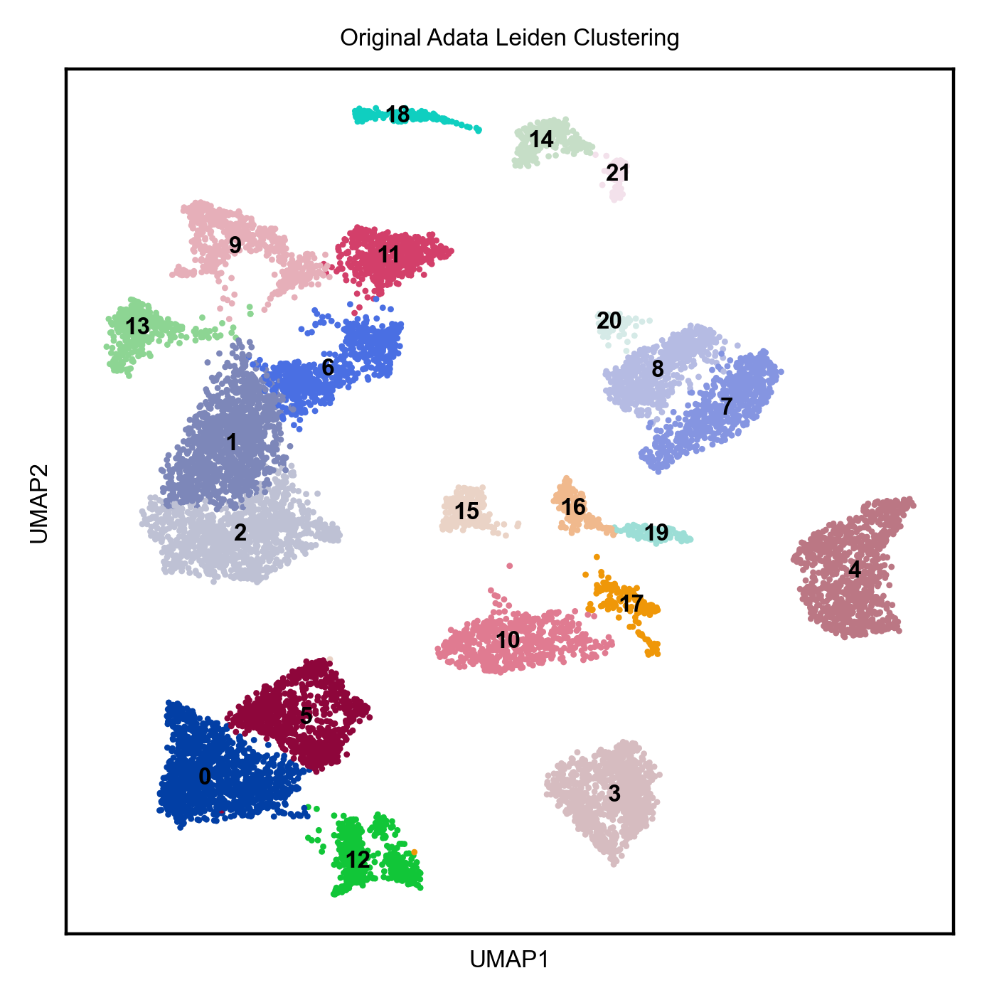

/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


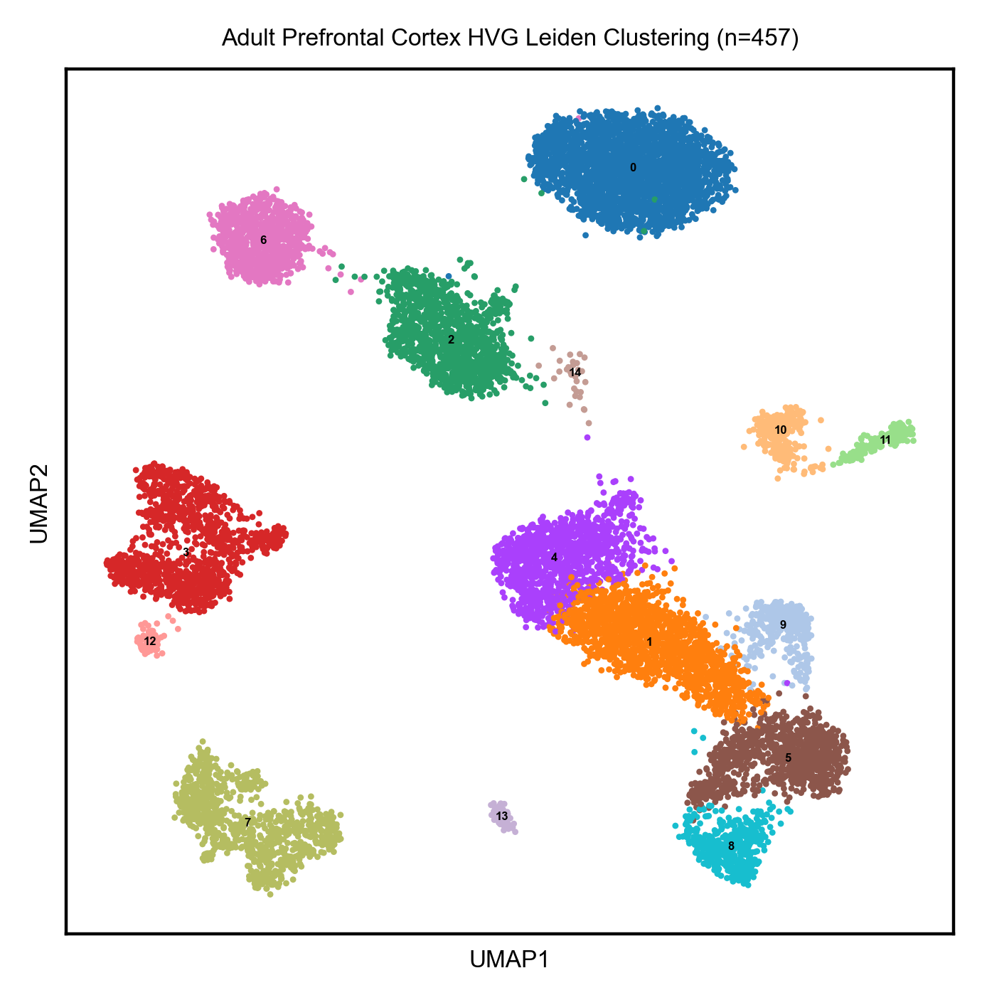

In [780]:
#--- Set our figures parameters ---#
sc.set_figure_params(scanpy=True, dpi=200, dpi_save=200, frameon=True, vector_friendly=True, fontsize=6, color_map='RdBu', facecolor='white', ipython_format='png2x')
#--- Let us plot the original adata L3 space and the curreny highly variable genes L3 space ---#
with plt.rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(adata, color = ['leiden'], title = 'Original Adata Leiden Clustering', legend_loc = 'on data')
    sc.pl.umap(adata_HVG, color=['leiden'], title='Adult Prefrontal Cortex HVG Leiden Clustering (n=457)', legend_loc='on data', legend_fontsize=3)
    

---

# View Adult Prefrontal cortex Highly Variable Genes vs. Original Space via L3 Cell-Type Clustering

---

/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


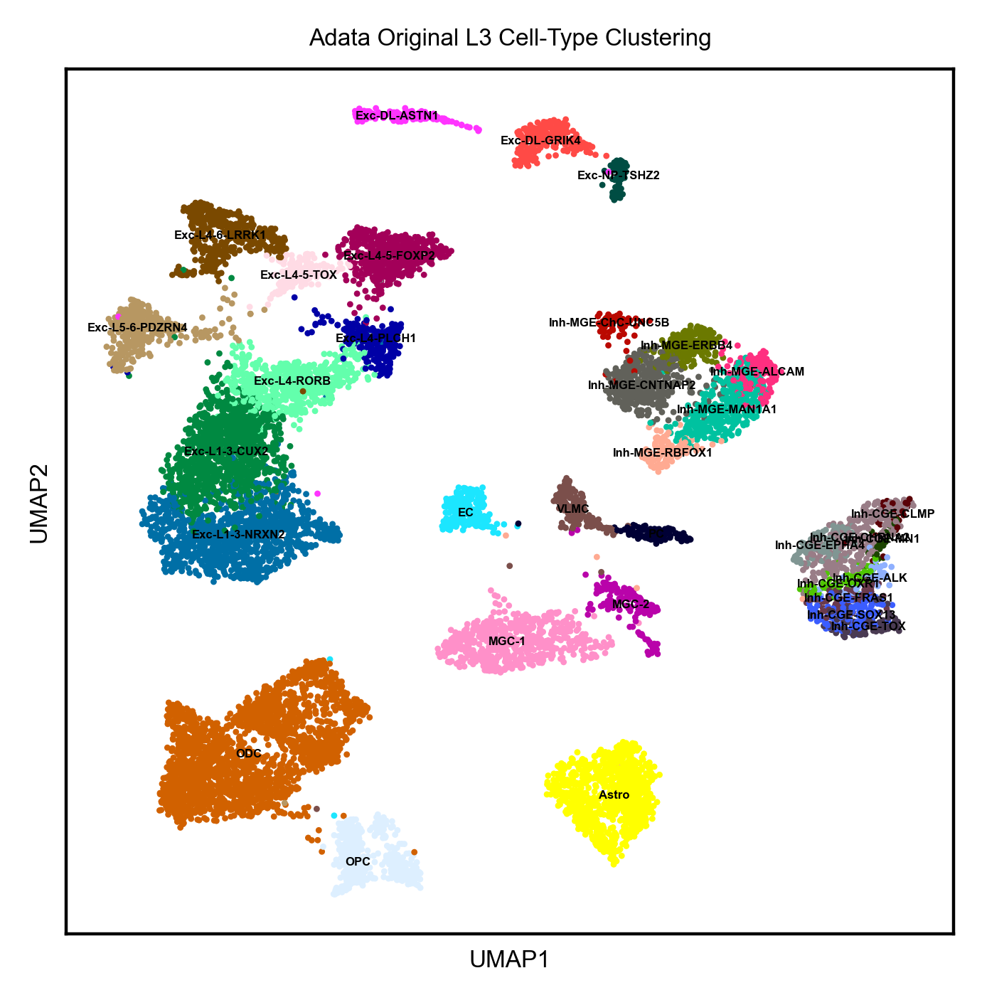

/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


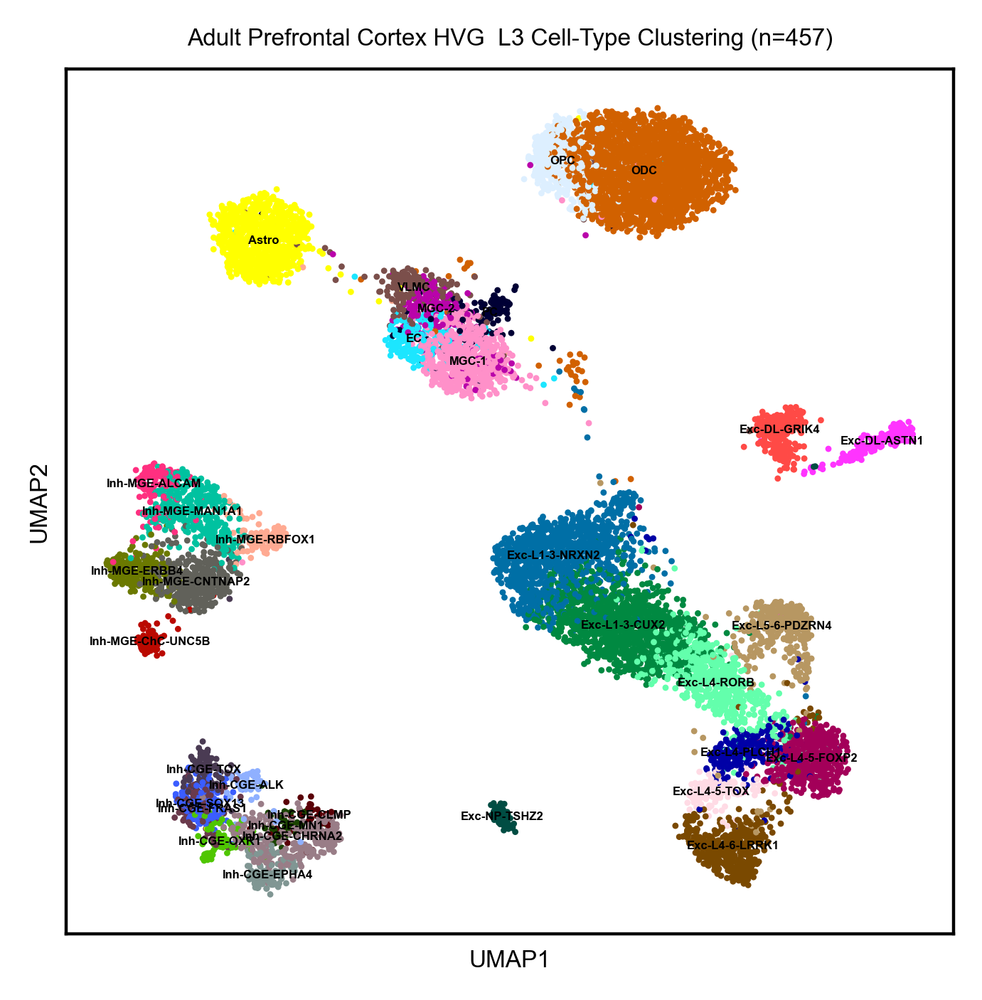

In [781]:
adata_HVG.obs['L3'] = adata.obs['L3']
#--- Set our figures parameters ---#
sc.set_figure_params(scanpy=True, dpi=200, dpi_save=200, frameon=True, vector_friendly=True, fontsize=6, color_map='RdBu', facecolor='white', ipython_format='png2x')
#--- Let us plot the original adata L3 space and the curreny highly variable genes L3 space ---#
with plt.rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(adata, color = ['L3'], title = 'Adata Original L3 Cell-Type Clustering', legend_loc = 'on data', legend_fontsize =3)
    sc.pl.umap(adata_HVG, color=['L3'], title='Adult Prefrontal Cortex HVG  L3 Cell-Type Clustering (n=457)', legend_loc='on data', legend_fontsize=3)
    

---

# <font color='purple'> Autoencoder on Prefrontal Cortex Highly Variable Genes</font>

---

In [931]:
class BaseAutoencoder(Model):
    def __init__(self, latent_dim, loss_function=tf.keras.losses.MeanSquaredError()):
        super(BaseAutoencoder, self).__init__()
        self.latent_dim = latent_dim
        self.loss_function = loss_function
        #--- Encoder ---#
        self.encoder = tf.keras.Sequential([
            layers.Dense(300, activation='relu'),
            layers.BatchNormalization(),
            layers.Dense(200, activation='relu'),
            layers.BatchNormalization(),
            layers.Dense(180, activation = 'relu'),
            layers.BatchNormalization(),
            layers.Dense(latent_dim, activation='relu')
        ])
        #--- Decoder ---#
        self.decoder = tf.keras.Sequential([
            layers.Dense(latent_dim, activation='relu'),
            layers.BatchNormalization(),
            layers.Dense(180, activation='relu'),
            layers.BatchNormalization(),
            layers.Dense(200, activation='relu'),
            layers.BatchNormalization(),
            layers.Dense(300, activation = 'relu'),
            layers.BatchNormalization(),
            layers.Dense(x_train_HVG.shape[1], activation='linear')
        ])
    #--- Connect the encoder and decoder ---#
    def call(self, inputs):
        encoded = self.encoder(inputs)
        decoded = self.decoder(encoded)
        return decoded
#--- Initialize the model ---3
latent_dim = 165
autoencoder = BaseAutoencoder(latent_dim)
loss_fn = tf.keras.losses.MeanSquaredError()
#--- Train ---#
epochs = 30
batch_size = 15
learning_rate = 0.005
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
autoencoder.compile(optimizer=optimizer, loss='mean_squared_error')
print('='*110)
history_HVG = autoencoder.fit(x_train_HVG, x_train_HVG, epochs=epochs, batch_size=batch_size, validation_data=(x_test_HVG, x_test_HVG))
print('='*110)

Epoch 1/30
534/534 [==============================] - 2s 3ms/step - loss: 0.0152 - val_loss: 0.0038
Epoch 2/30
534/534 [==============================] - 1s 3ms/step - loss: 0.0032 - val_loss: 0.0032
Epoch 3/30
534/534 [==============================] - 1s 3ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 4/30
534/534 [==============================] - 1s 3ms/step - loss: 0.0023 - val_loss: 0.0018
Epoch 5/30
534/534 [==============================] - 1s 3ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 6/30
534/534 [==============================] - 1s 3ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 7/30
534/534 [==============================] - 1s 3ms/step - loss: 0.0013 - val_loss: 9.7137e-04
Epoch 8/30
534/534 [==============================] - 1s 2ms/step - loss: 0.0012 - val_loss: 0.0010
Epoch 9/30
534/534 [==============================] - 1s 2ms/step - loss: 0.0011 - val_loss: 8.5401e-04
Epoch 10/30
534/534 [==============================] - 1s 2ms/step - loss: 0.0011 - val_loss

---

# <font color='purple'>Visualize the Predicted Data and the Latent Space</font>

---

In [933]:
#--- View the predicted dataframe ---#
Predicted_Autoencoder_Data = sc.AnnData(pd.DataFrame(autoencoder.predict(adata_HVG.X), columns=adata_HVG.var_names, index=adata_HVG.obs_names))
Predicted_Autoencoder_Data.obs['L3'] = adata_HVG.obs['L3']
#--- Get the latent space ---#
Latent_Space_Autoencoder = sc.AnnData(pd.DataFrame(autoencoder.encoder.predict(adata_HVG.X)))
sc.tl.pca(Latent_Space_Autoencoder)
sc.pp.neighbors(Latent_Space_Autoencoder)
sc.tl.umap(Latent_Space_Autoencoder)
sc.tl.leiden(Latent_Space_Autoencoder)
#--- Run Clustering Metrics ---#
sc.tl.pca(Predicted_Autoencoder_Data)
sc.pp.neighbors(Predicted_Autoencoder_Data)
sc.tl.umap(Predicted_Autoencoder_Data)
sc.tl.leiden(Predicted_Autoencoder_Data)
#--- Visualize the Results ---#
with plt.rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(Latent_Space_Autoencoder,color =['leiden'], legend_loc = 'on data', title = 'Autoencoder Latent Space Leiden Clustering' , legend_fontsize =5)
    sc.pl.umap(Predicted_Autoencoder_Data, color = ['leiden'], legend_loc = 'on data', title = 'Autoencoder Leiden Predicted Clusters', legend_fontsize=5)
    sc.pl.umap(Predicted_Autoencoder_Data, color=['L3'], legend_loc='on data', legend_fontsize=5, title='Autoencoder L3 Cell-Type Clustering')
    

374/374 [==============================] - 0s 813us/step


KeyError: 'L3'

/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


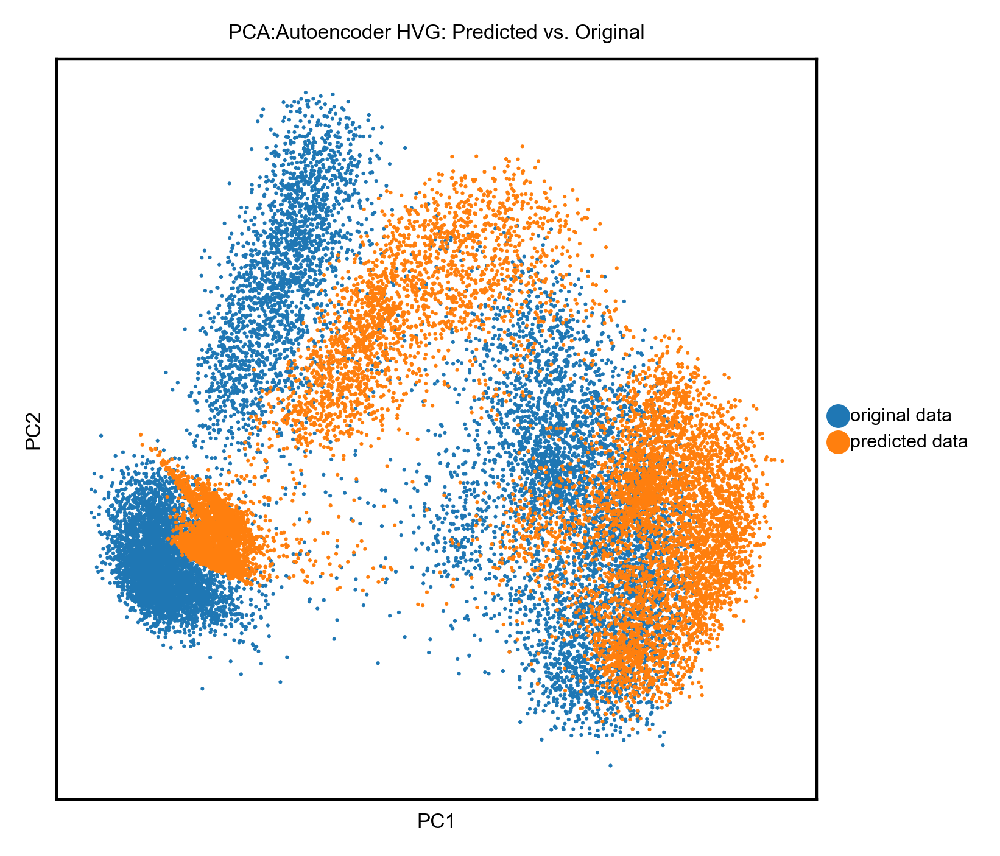

/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


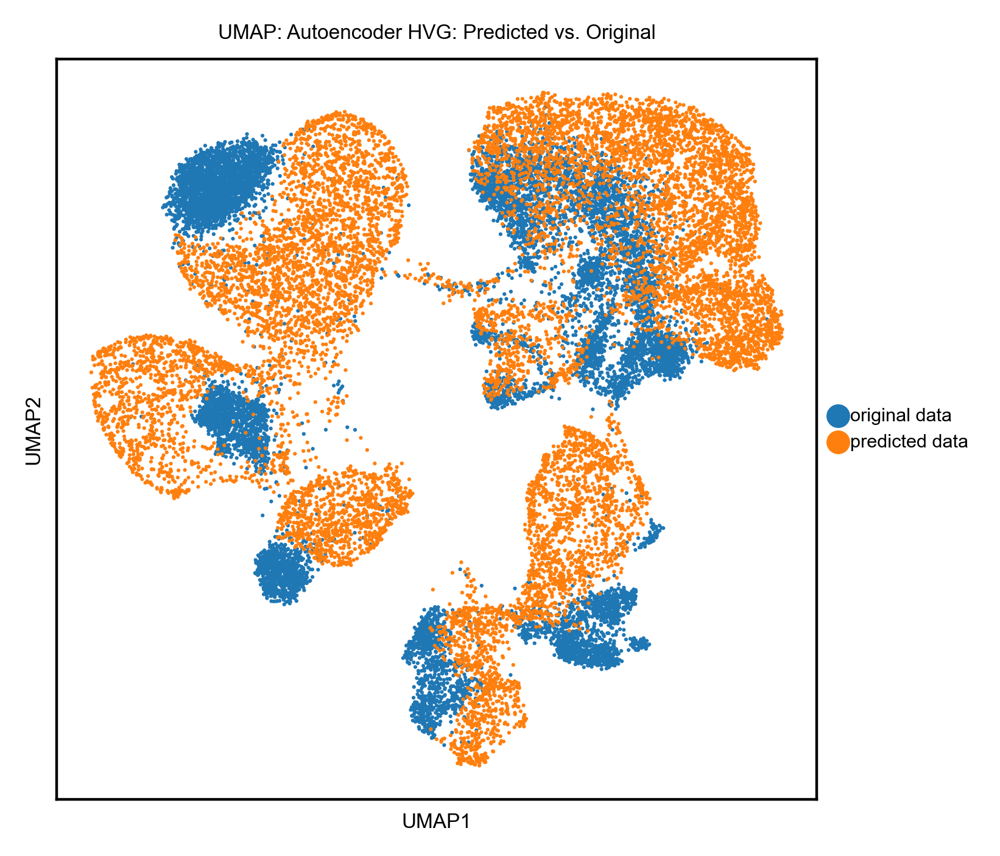

In [784]:
#--- Original Batch and Predicted batch for observations ---#
adata_HVG.obs['batch'] = 'original data' 
Predicted_Autoencoder_Data.obs['batch'] = 'predicted data'
#--- Merge our data ---#
merged_adata = anndata.concat([adata_HVG, Predicted_Autoencoder_Data], axis=0)
merged_adata.obs['cell_type'] = adata_HVG.obs['L3']
#--- Compute clustering metrics ---#
sc.tl.pca(merged_adata)
sc.pp.neighbors(merged_adata)
sc.tl.umap(merged_adata)
sc.tl.leiden(merged_adata)
#--- Visualize the original and predicted UMAP spaces ---#
sc.pl.pca(merged_adata, color=['batch'], legend_loc = 'right margin', title = 'PCA:Autoencoder HVG: Predicted vs. Original')
sc.pl.umap(merged_adata, color = ['batch'], legend_loc= 'right margin', title = 'UMAP: Autoencoder HVG: Predicted vs. Original')

---

# <font color='purple'>Get the Adjusted Rand Index Score between the leiden Clusters</font>

----

/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


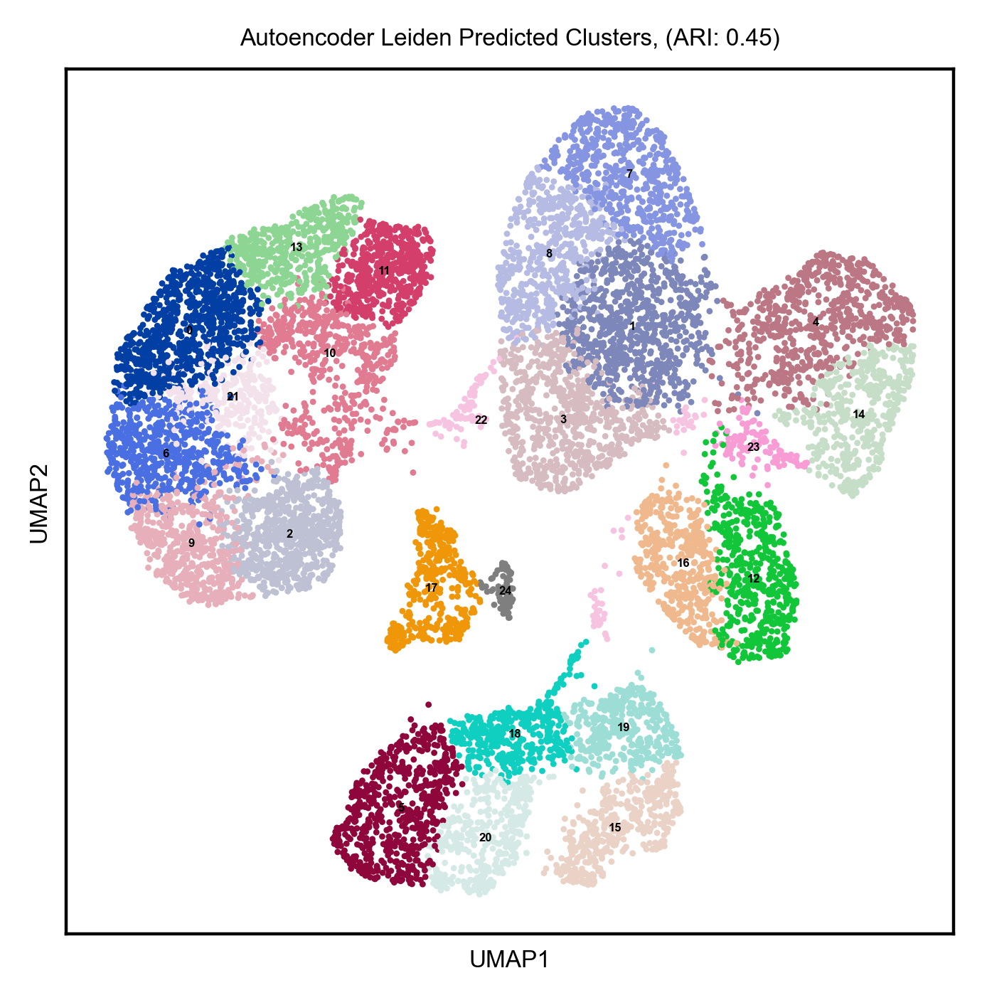

In [786]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, cluster 


#--- Get the labels for leiden assignments ---#
Original_HVG_leiden_Assignments = adata_HVG.obs['leiden']
Autoencoder_HVG_Predicted_leiden_Assignments = Predicted_Autoencoder_Data.obs['leiden']
#--- Get the ARI score, NMI Score, and Purity Score---#

ARI_Score_Autoencoder_HVG = adjusted_rand_score(Original_HVG_leiden_Assignments,Autoencoder_HVG_Predicted_leiden_Assignments)


with plt.rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(Predicted_Autoencoder_Data, color=['leiden'], title=f'Autoencoder Leiden Predicted Clusters, (ARI: {ARI_Score_Autoencoder_HVG:.2f})', legend_loc='on data', legend_fontsize=3)



---

# <font color='purple'>Display/make the observation names unique</font>

---

In [864]:
adata_HVG.obs['L3']

20210111-1863-preAb-PFC-B12_A3              Astro
20210111-1863-preAb-PFC-B12_A23               OPC
20210111-1863-preAb-PFC-B12_B10    Exc-L4-5-FOXP2
20210111-1863-preAb-PFC-B12_A1      Exc-L1-3-CUX2
20210111-1863-preAb-PFC-B12_A9       Exc-DL-ASTN1
                                        ...      
SRR9014785                                    ODC
SRR9014797                         Inh-CGE-CHRNA2
SRR9014803                         Exc-L1-3-NRXN2
SRR9014807                                  Astro
SRR9014813                                    ODC
Name: L3, Length: 11946, dtype: category
Categories (34, object): ['Astro', 'EC', 'Exc-DL-ASTN1', 'Exc-DL-GRIK4', ..., 'ODC', 'OPC', 'PC', 'VLMC']

In [787]:
print(list(adata_HVG.obs['L3'].unique()))
Predicted_Autoencoder_Data.obsm['X_umap']=adata_HVG.obsm['X_umap']

['Astro', 'OPC', 'Exc-L4-5-FOXP2', 'Exc-L1-3-CUX2', 'Exc-DL-ASTN1', 'ODC', 'Exc-L4-RORB', 'Inh-MGE-MAN1A1', 'Inh-CGE-CLMP', 'Exc-L1-3-NRXN2', 'Exc-L5-6-PDZRN4', 'Inh-MGE-ALCAM', 'Exc-L4-6-LRRK1', 'Inh-CGE-SOX13', 'Inh-MGE-RBFOX1', 'Exc-DL-GRIK4', 'VLMC', 'MGC-2', 'MGC-1', 'Inh-CGE-MN1', 'Inh-CGE-CHRNA2', 'EC', 'Inh-MGE-ERBB4', 'PC', 'Inh-MGE-CNTNAP2', 'Exc-L4-PLCH1', 'Inh-CGE-TOX', 'Exc-L4-5-TOX', 'Exc-NP-TSHZ2', 'Inh-MGE-ChC-UNC5B', 'Inh-CGE-EPHA4', 'Inh-CGE-ALK', 'Inh-CGE-OXR1', 'Inh-CGE-FRAS1']


---

# <font color='purple'> Create a Comparison Dataframe for Original and Reconstructed Data methylation levels</font>

---

(0.0, 100.0)

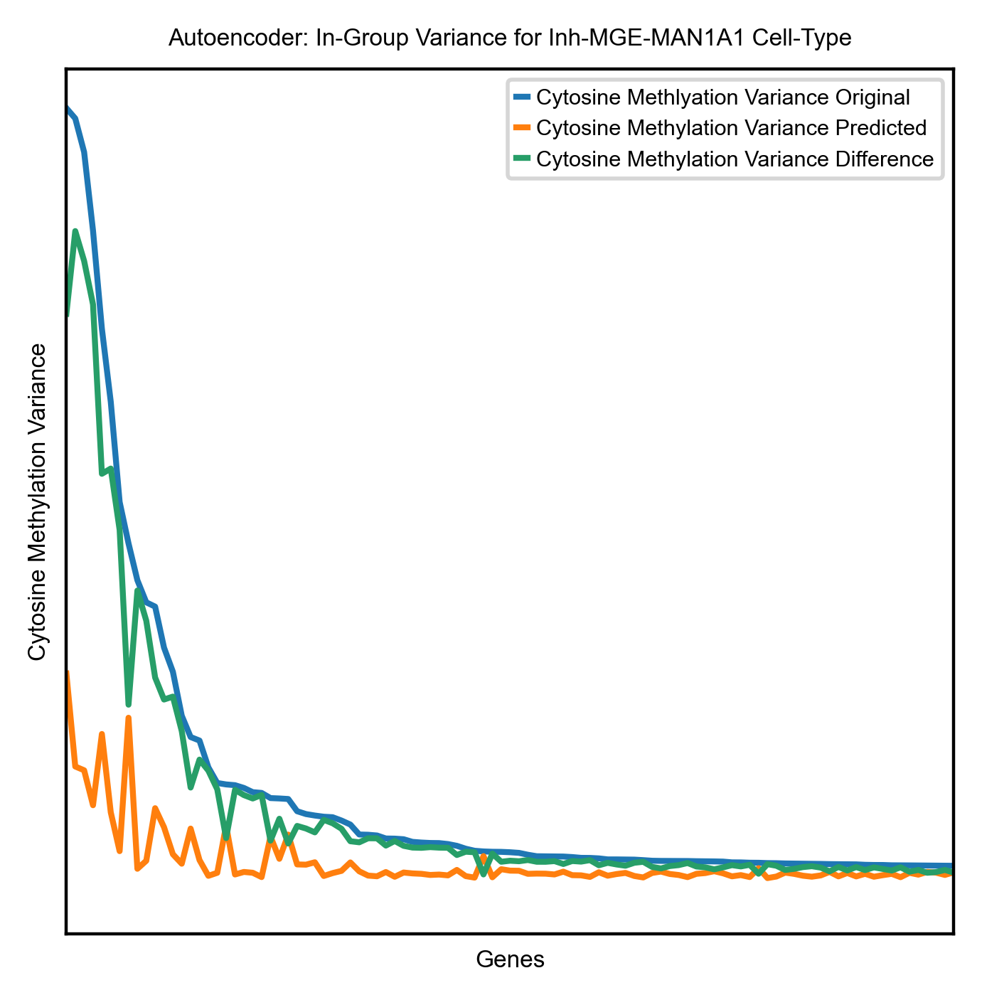

In [867]:

#--- In group variance of the Astro cell-type ---#
Autoencoder_var=pd.DataFrame(adata_HVG[adata_HVG.obs['L3'].isin(['Inh-MGE-MAN1A1'])].to_df().var()) # Get the genes for Astro cell type
Autoencoder_var.columns=['original'] # In our dataframe create a column called original
#--- Create the Predcited Column which are the values for Astro cell type by gene from autoencoder ---#
Autoencoder_var['Predicted']=pd.DataFrame( Predicted_Autoencoder_Data[ Predicted_Autoencoder_Data.obs['L3'].isin(['Inh-MGE-MAN1A1'])].to_df().var())[0]
#--- Create the difference column which subtracts the original methylation values from predicted to show noise reduction ---#
Autoencoder_var['Difference']=Autoencoder_var['original']-Autoencoder_var['Predicted']
#--- Sort our dataframe by the difference column ---#
Autoencoder_var=Autoencoder_var.sort_values('original',ascending=False)

sns.lineplot(Autoencoder_var['original'], label = 'Cytosine Methlyation Variance Original')
sns.lineplot(Autoencoder_var['Predicted'], label = 'Cytosine Methylation Variance Predicted')
sns.lineplot(Autoencoder_var['Difference'], label = 'Cytosine Methylation Variance Difference')
plt.title('Autoencoder: In-Group Variance for Inh-MGE-MAN1A1 Cell-Type')
plt.xlabel('Genes')
plt.ylabel('Cytosine Methylation Variance')
plt.xticks([])
plt.yticks([])
plt.legend()
plt.xlim(0, 100)

In [789]:
Autoencoder_Astro

,original,Predicted,Difference
region,,,
PROX1_CG,0.026908,0.004439,2.246959e-02
TLE4_CG,0.025090,0.001413,2.367697e-02
MN1_CG,0.025027,0.004478,2.054969e-02
ARPP21_CG,0.023754,0.002913,2.084105e-02
HRH2_CG,0.020020,0.001153,1.886737e-02
...,...,...,...
ATRNL1_CH,0.000015,0.000012,3.582893e-06
KCNIP4_CH,0.000015,0.000026,-1.117105e-05
NRXN1_CH,0.000014,0.000006,8.361993e-06


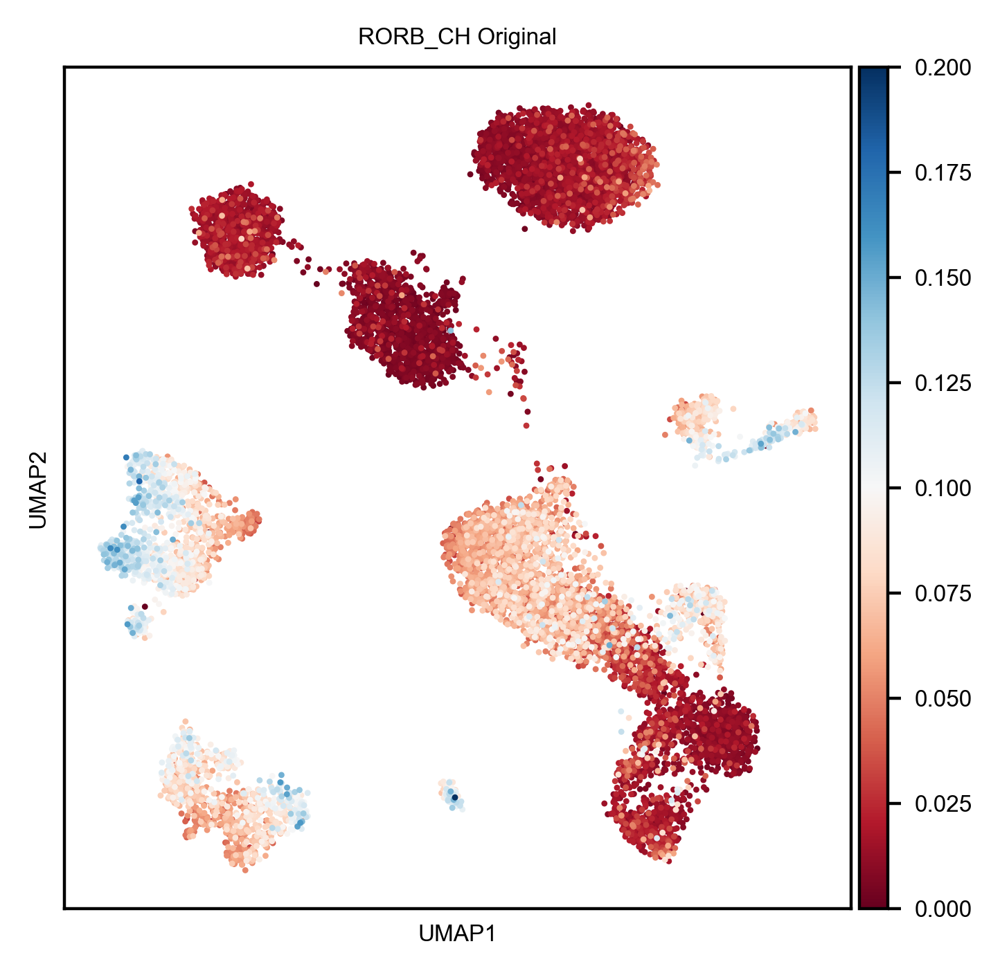

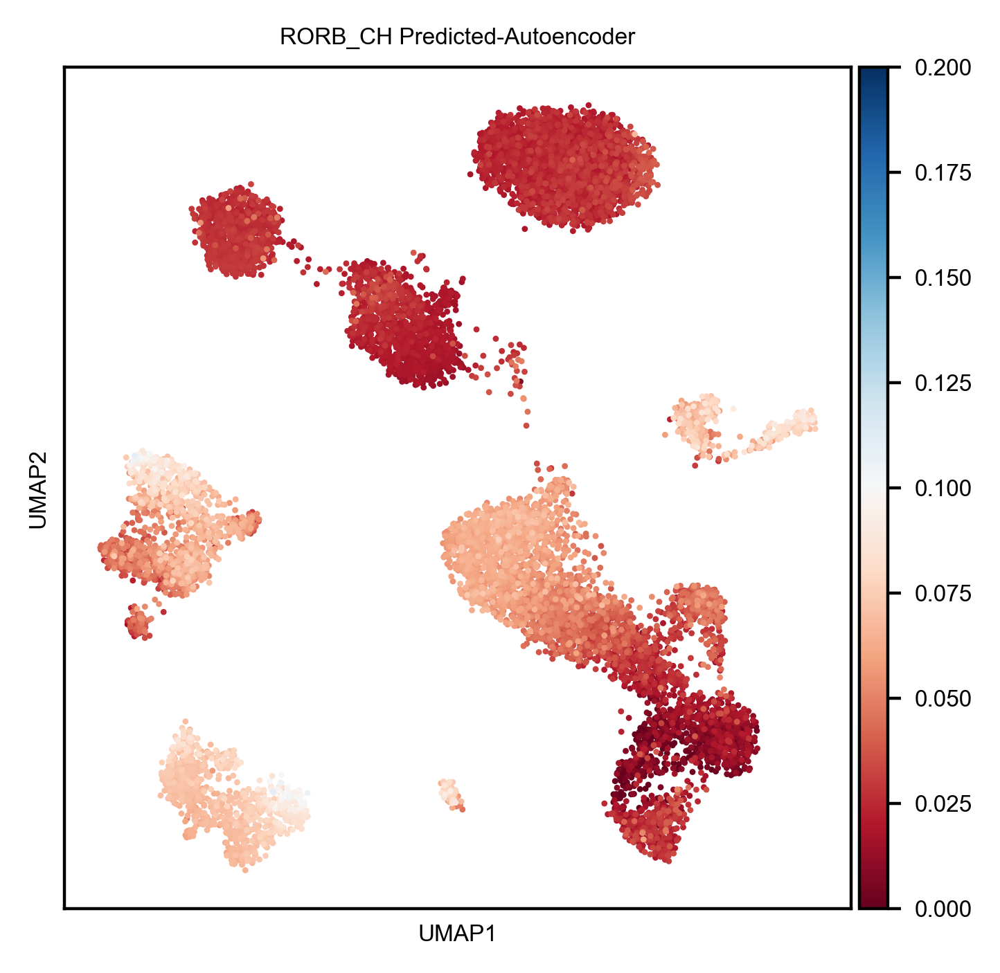

In [851]:
i = 'RORB_CH' # gene in astro cell type
sc.pl.umap(adata_HVG,color=i,vmax=0.2,vmin=0, title = 'RORB_CH Original')
sc.pl.umap(Predicted_Autoencoder_Data,color=i,vmax=0.2,vmin=0, title='RORB_CH Predicted-Autoencoder')

---

# <font color='blue'> VAE on Prefrontal Cortex Highly Variable Genes</font>

---

In [791]:
class scVAE(keras.Model): 
    def __init__(self, latent_dim, original_dim, epochs, batch_size,
                 optimizer=keras.optimizers.Adam(learning_rate=0.005),
                 recon_loss_function=tf.keras.losses.MeanSquaredError()):  # Initialize the model with the given parameters
        super(scVAE, self).__init__()
        # Initialization parameters
        self.latent_dim = latent_dim
        self.original_dim = original_dim
        self.epochs = epochs
        self.batch_size = batch_size
        self.optimizer = optimizer
        self.recon_loss_function = recon_loss_function
        # Define the construction of the encoder with optimizer and loss
        self.encoder = self.generate_encoder()
        self.encoder.compile(optimizer=optimizer, loss=self.vae_loss)
        # Define the construction of the decoder with optimizer and loss
        self.decoder = self.generate_decoder()
        self.decoder.compile(optimizer=optimizer, loss=self.vae_loss)
        # Construction of vae loss 
        self.mu = None
        self.sigma = None
        self.kappa = 1 
    # VAE loss
    def vae_loss(self, y_true, y_pred): # Define the vae_loss function
        recon = self.recon_loss_function(y_true, y_pred) # Reconstruction loss is MSE of observed values vs. predicted
        if self.mu is None or self.sigma is None:  # Both mu and sigma are initialized to be None
            self.mu = K.zeros_like(y_true)  # Return zero tensor with shape of true values
            self.sigma = K.zeros_like(y_true)  # Return zero tensor with shape of predicted values
        # Calculate the kl divergence
        kl = K.mean(0.5 * K.sum(K.exp(self.sigma) + K.square(self.mu) - 1. - self.sigma, axis=1))
        # Scale down the contribution of the KL loss to prioritize the reconstruction accuracy 
        return recon, self.kappa * kl / 250 
    # Sampling function
    def sample_z(self, args): # Define the sampling function (samples from the latent variable Z)
        vae_mu, vae_sigma = args # The arguments of sample_z are the mu vector and sigma vector from encoder
        # epsilon is a random distributed tensor that has the shape of vae_mu and has mean 0 and std of 1
        eps = K.random_normal(shape=(K.shape(vae_mu)[0], K.shape(vae_mu)[1]), mean=0., stddev=1., seed=42)
        # Generate a sample from the latent space, Z. 
        return vae_mu + K.exp(vae_sigma / 2) * eps
    # KL loss
    def kl_loss(self): # Define the Kullback-Leibler Divegence Loss
        return K.mean(0.5 * K.sum(K.exp(self.sigma) + K.square(self.mu) - 1. - self.sigma, axis=1))
    # The encoder model
    def generate_encoder(self):
        Encoder_Inputs = keras.Input(shape=(self.original_dim,))
        Hidden_1 = layers.Dense(300, activation='relu')(Encoder_Inputs)
        BatchNorm1 = layers.BatchNormalization()(Hidden_1)
        Hidden_3 = layers.Dense(200, activation = 'relu')(BatchNorm1)
        BatchNorm2 = layers.BatchNormalization()(Hidden_3)
        Hidden_4 = layers.Dense(180, activation = 'relu')(BatchNorm2)
        BatchNorm3 = layers.BatchNormalization()(Hidden_4)
        vae_mu = layers.Dense(self.latent_dim, activation='linear')(BatchNorm3)
        vae_sigma = layers.Dense(self.latent_dim, activation='linear')(BatchNorm3)
        return Model(Encoder_Inputs, [vae_mu, vae_sigma], name='Encoder')

    # This is the same as the function above.
    def perform_sampling(self, args):
        vae_mu, vae_sigma = args
        eps = K.random_normal(shape=(K.shape(vae_mu)[0], K.shape(vae_mu)[1]), mean=0., stddev=1., seed=42)
        return vae_mu + K.exp(vae_sigma / 2) * eps
    # Generate the decoder
    def generate_decoder(self):
        latent_input = keras.Input(shape=(self.latent_dim,))
        hid_1 = layers.Dense(180, activation = 'relu')(latent_input)
        hidden_layer = layers.Dense(200, activation='relu')(hid_1)
        hid_2 = layers.Dense(300, activation = 'relu')(hidden_layer)
        out_prediction = layers.Dense(self.original_dim, activation='linear', name='Out_Prediction')(hid_2)
        return Model(latent_input, out_prediction, name='decoder')
    # Define the prediction function which returns the reconstructed
    def predict(self, x):
        mu, sigma = self.encoder.predict(x) # Connect the encoder to the latent space
        z = self.perform_sampling([mu, sigma]) # Sample from the latent variable Z
        x_pred = self.decoder.predict(z) # Predict what the input was from latent variable Z
        return x_pred # Return the reconstructed or predicted value from model
    # Custom Training function
    def train(self, x_train, x_val):
        train_dataset = tf.data.Dataset.from_tensor_slices((x_train, x_train)).shuffle(len(x_train)).batch(self.batch_size)
        val_dataset = tf.data.Dataset.from_tensor_slices((x_val, x_val)).batch(self.batch_size)

        train_losses = []
        val_losses = []
        
        print('='*50)
        
        for epoch in range(self.epochs):
            print(f"Epoch {epoch+1}/{self.epochs}")

            # Training loop
            train_loss = 0.0
            for step, (x_batch_train, y_batch_train) in enumerate(train_dataset):
                with tf.GradientTape() as tape:
                    mu, sigma = self.encoder(x_batch_train, training=True)
                    z = self.perform_sampling([mu, sigma])
                    x_pred = self.decoder(z, training=True)
                    recon_loss, kl_loss = self.vae_loss(x_batch_train, x_pred)
                    loss = recon_loss + kl_loss

                gradients = tape.gradient(loss, self.trainable_variables)
                self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))

                train_loss += loss.numpy()

            train_loss /= (step + 1)
            train_losses.append(train_loss)

            # Validation loop
            val_loss = 0.0
            for x_batch_val, y_batch_val in val_dataset:
                mu_val, sigma_val = self.encoder(x_batch_val, training=False)
                z_val = self.perform_sampling([mu_val, sigma_val])
                x_pred_val = self.decoder(z_val, training=False)
                recon_loss_val, kl_loss_val = self.vae_loss(x_batch_val, x_pred_val)
                loss_val = recon_loss_val + kl_loss_val

                val_loss += loss_val.numpy()

            val_loss /= len(val_dataset)
            val_losses.append(val_loss)
            
            print('='*50)

            print(f"Train loss: {train_loss:.4f}, Val loss: {val_loss:.4f}")
            
            print('='*50)

        return train_losses, val_losses
    
#--- Define the training parameters and initialize the model ---#
latent_dim = 165
original_dim = x_train_HVG.shape[1]
epochs = 10
batch_size = 50
vae = scVAE(latent_dim=latent_dim, original_dim=original_dim, epochs = epochs, batch_size= batch_size)
#---Train the Model---#
train_losses, val_losses = vae.train(x_train_HVG, x_test_HVG)

Epoch 1/10
Train loss: 0.0055, Val loss: 0.0023
Epoch 2/10
Train loss: 0.0014, Val loss: 0.0014
Epoch 3/10
Train loss: 0.0012, Val loss: 0.0012
Epoch 4/10
Train loss: 0.0011, Val loss: 0.0011
Epoch 5/10
Train loss: 0.0010, Val loss: 0.0013
Epoch 6/10
Train loss: 0.0010, Val loss: 0.0010
Epoch 7/10
Train loss: 0.0010, Val loss: 0.0012
Epoch 8/10
Train loss: 0.0010, Val loss: 0.0011
Epoch 9/10
Train loss: 0.0009, Val loss: 0.0009
Epoch 10/10
Train loss: 0.0009, Val loss: 0.0011


---

# <font color='blue'>Visualize the Predicted Data and the Latent Space for VAE</font>

---

/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


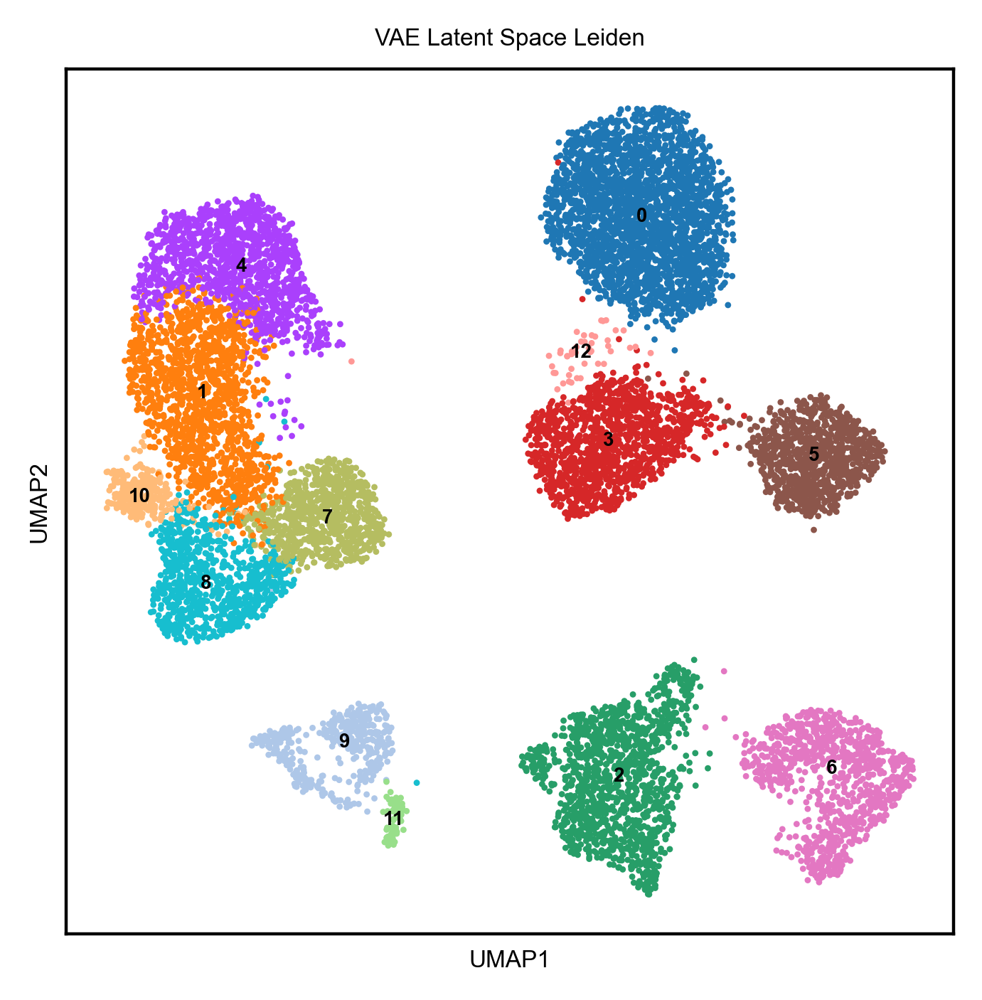

/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


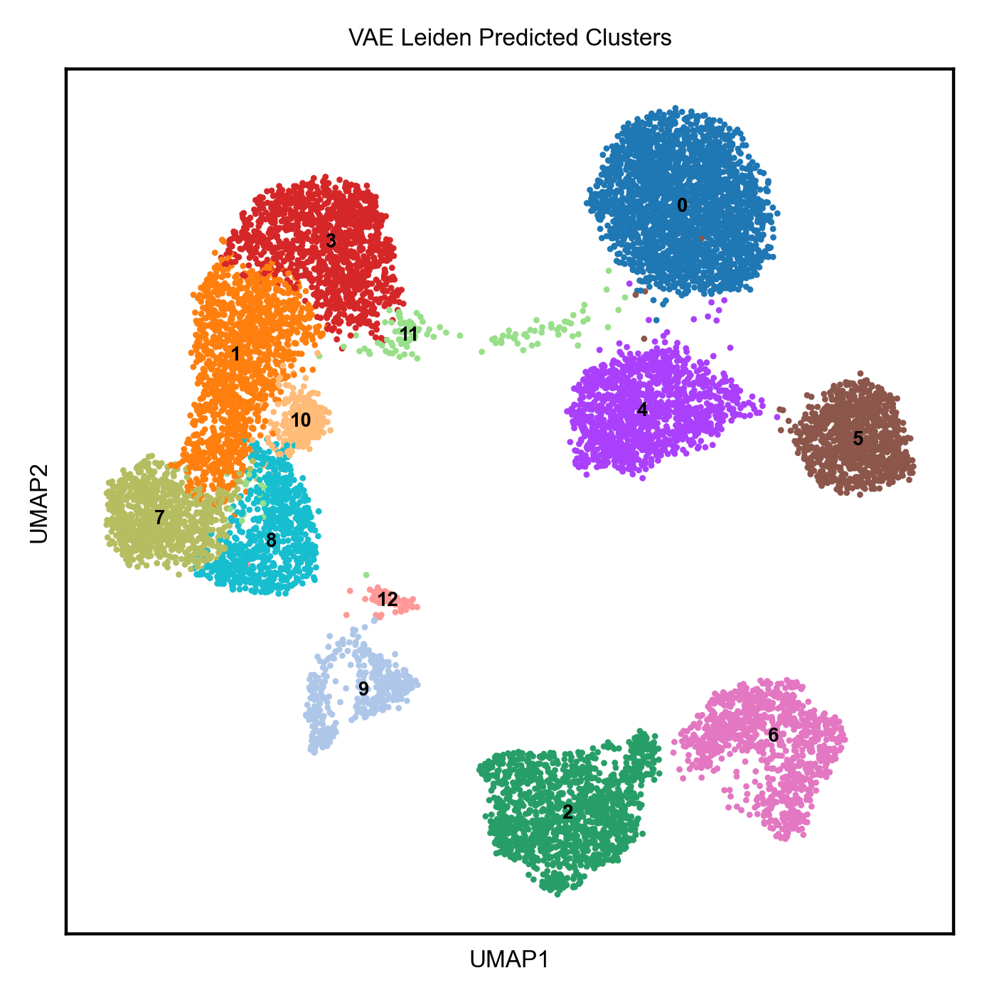

/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


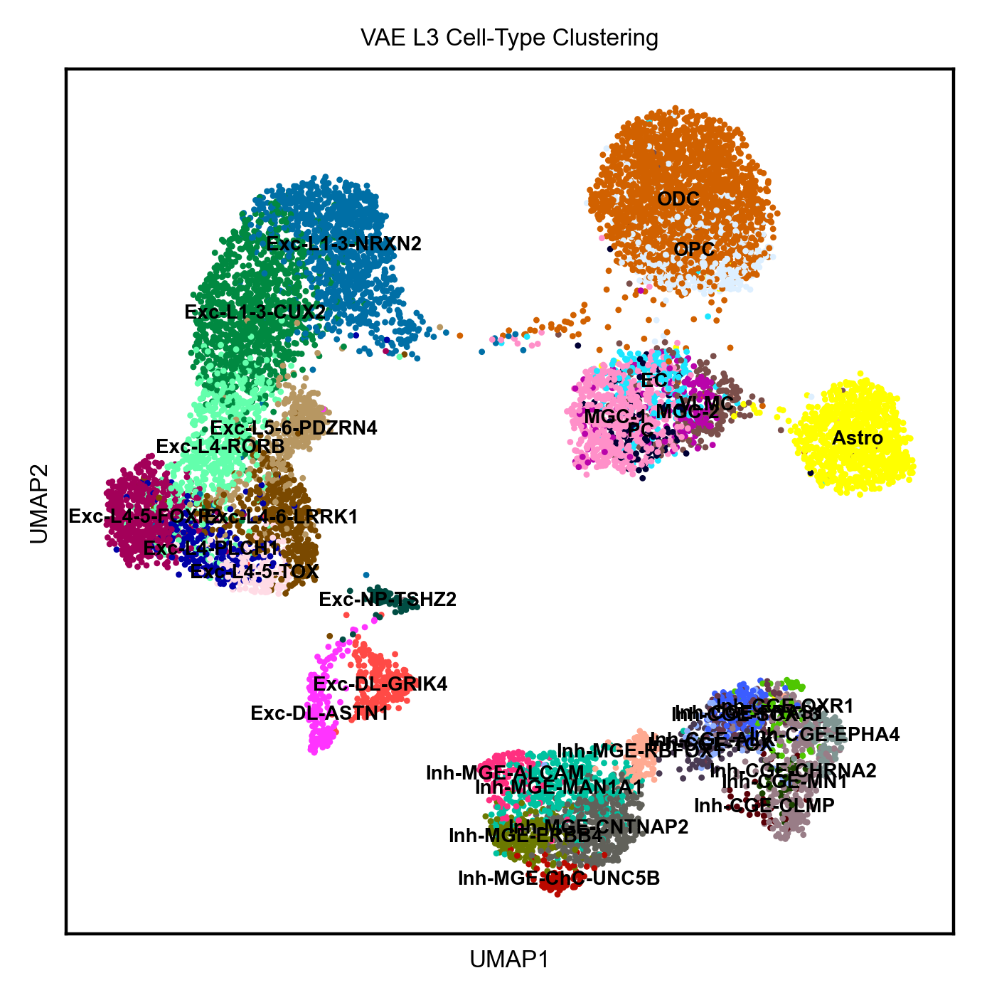

In [792]:
#--- View the predicted dataframe for VAE---#
#Predicted_VAE_Data = sc.AnnData(pd.DataFrame(vae.predict(adata_HVG.X), columns=adata_HVG.var_names, index=adata_HVG.obs_names))
#Predicted_VAE_Data.obs['L3'] = adata_HVG.obs['L3']
#--- Get the latent space ---#
#Latent_Space_VAE = sc.AnnData(pd.DataFrame(vae.encoder.predict(adata_HVG.X)[0]))
#sc.tl.pca(Latent_Space_VAE)
#sc.pp.neighbors(Latent_Space_VAE)
#sc.tl.umap(Latent_Space_VAE)
#sc.tl.leiden(Latent_Space_VAE)
#--- Run Clustering Metrics ---#
#sc.tl.pca(Predicted_VAE_Data)
#sc.pp.neighbors(Predicted_VAE_Data)
#sc.tl.umap(Predicted_VAE_Data)
#sc.tl.leiden(Predicted_VAE_Data)
#--- Visualize the Results ---#
with plt.rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(Latent_Space_VAE,color =['leiden'], legend_loc = 'on data', title = 'VAE Latent Space Leiden' , legend_fontsize =5)
    sc.pl.umap(Predicted_VAE_Data, color = ['leiden'], legend_loc = 'on data', title = 'VAE Leiden Predicted Clusters', legend_fontsize=5)
    sc.pl.umap(Predicted_VAE_Data, color=['L3'], legend_loc='on data', legend_fontsize=5, title='VAE L3 Cell-Type Clustering')
    

---

# <font color = 'blue'> Get the ARI score for the Predicted Data via leiden
    
---

/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


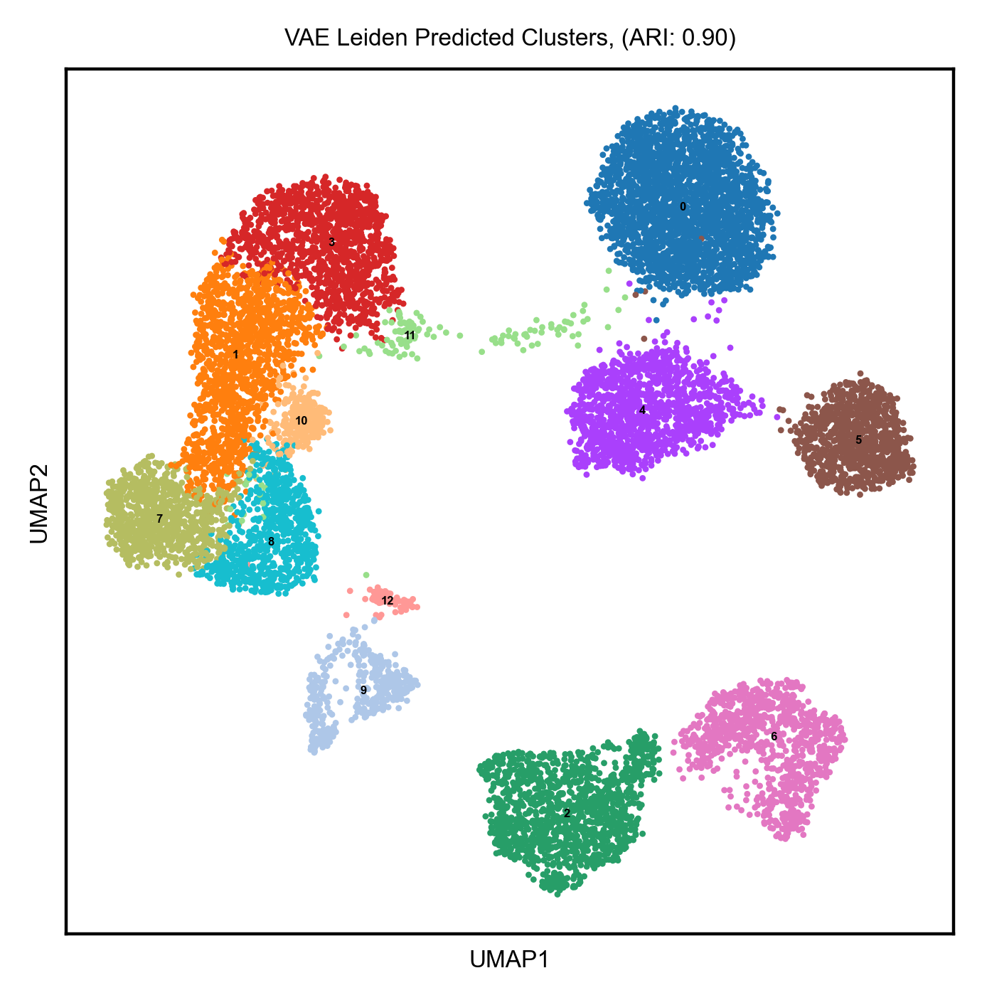

In [793]:
#--- Get the labels for leiden assignments ---#
Original_HVG_leiden_Assignments = adata_HVG.obs['leiden']
VAE_HVG_Predicted_leiden_Assignments = Predicted_VAE_Data.obs['leiden']
#--- Get the ARI score ---#

ARI_Score_VAE_HVG = adjusted_rand_score(Original_HVG_leiden_Assignments,VAE_HVG_Predicted_leiden_Assignments)

with plt.rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(Predicted_VAE_Data, color=['leiden'], title=f'VAE Leiden Predicted Clusters, (ARI: {ARI_Score_VAE_HVG:.2f})', legend_loc='on data', legend_fontsize=3)


---

# <font color='Blue'> Create a Comparison Dataframe for Original and Reconstructed Data methylation levels</font>

---

In [891]:
adata_HVG.obs['L3'][1:20]

20210111-1863-preAb-PFC-B12_A23                OPC
20210111-1863-preAb-PFC-B12_B10     Exc-L4-5-FOXP2
20210111-1863-preAb-PFC-B12_A1       Exc-L1-3-CUX2
20210111-1863-preAb-PFC-B12_A9        Exc-DL-ASTN1
20210111-1863-preAb-PFC-B12_B13     Exc-L4-5-FOXP2
20210111-1863-preAb-PFC-B12_B15              Astro
20210111-1863-preAb-PFC-B12_A22                ODC
20210111-1863-preAb-PFC-B12_A4      Exc-L4-5-FOXP2
20210111-1863-preAb-PFC-B12_A12        Exc-L4-RORB
20210111-1863-preAb-PFC-B12_A20              Astro
20210111-1863-preAb-PFC-B12_A13     Exc-L4-5-FOXP2
20210111-1863-preAb-PFC-B12_A19      Exc-L1-3-CUX2
20210111-1863-preAb-PFC-B12_A16     Inh-MGE-MAN1A1
20210111-1863-preAb-PFC-B12_B3        Inh-CGE-CLMP
20210111-1863-preAb-PFC-B12_A8         Exc-L4-RORB
20210111-1863-preAb-PFC-B12_A2      Exc-L1-3-NRXN2
20210111-1863-preAb-PFC-B12_A11    Exc-L5-6-PDZRN4
20210111-1863-preAb-PFC-B12_B12      Inh-MGE-ALCAM
20210111-1863-preAb-PFC-B12_C13    Exc-L5-6-PDZRN4
Name: L3, dtype: category
Categ

(0.0, 100.0)

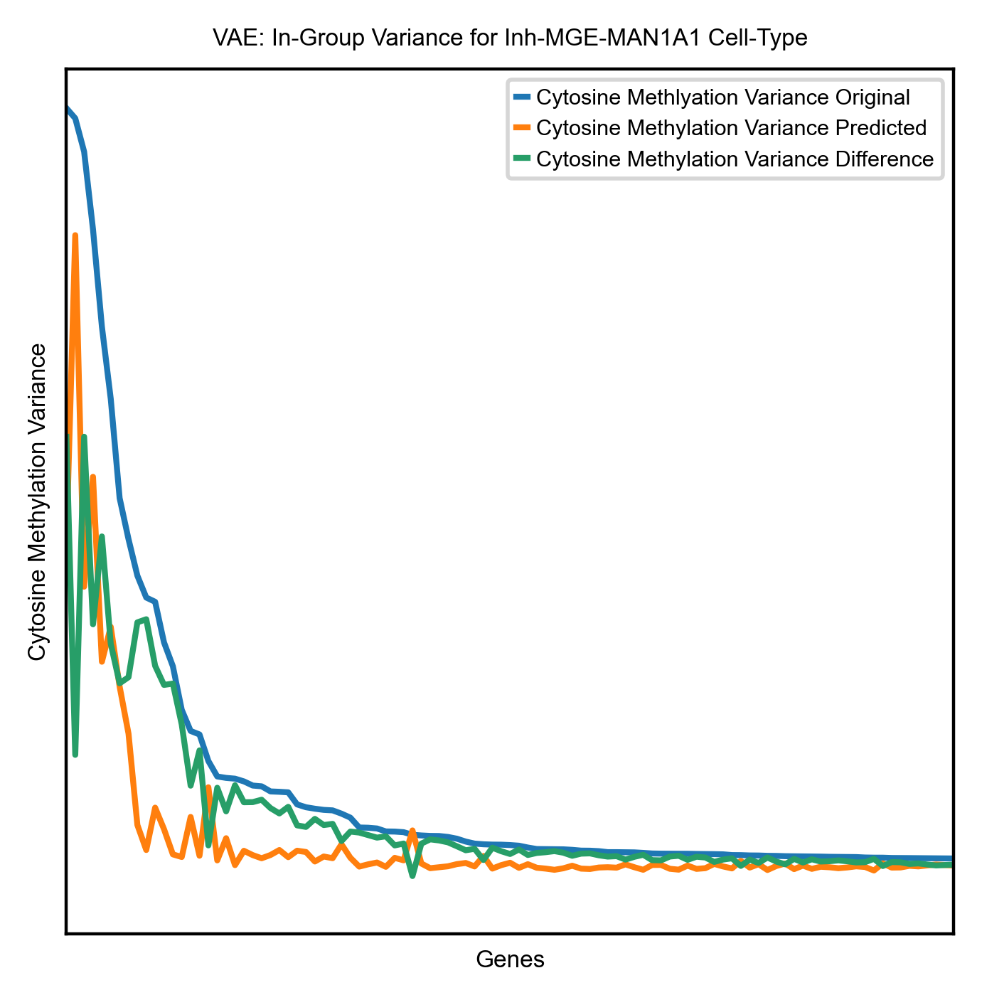

In [892]:

#--- In group variance of the Astro cell-type ---#
VAE_var=pd.DataFrame(adata_HVG[adata_HVG.obs['L3'].isin(['Inh-MGE-MAN1A1'])].to_df().var()) # Get the genes for Astro cell type
VAE_var.columns=['original'] # In our dataframe create a column called original
#--- Create the Predcited Column which are the values for Astro cell type by gene from autoencoder ---#
VAE_var['Predicted']=pd.DataFrame( Predicted_VAE_Data[ Predicted_VAE_Data.obs['L3'].isin(['Inh-MGE-MAN1A1'])].to_df().var())[0]
#--- Create the difference column which subtracts the original methylation values from predicted to show noise reduction ---#
VAE_var['Difference']=VAE_var['original']-VAE_var['Predicted']
#--- Sort our dataframe by the difference column ---#
VAE_var=VAE_var.sort_values('original',ascending=False)

sns.lineplot(VAE_var['original'], label = 'Cytosine Methlyation Variance Original')
sns.lineplot(VAE_var['Predicted'], label = 'Cytosine Methylation Variance Predicted')
sns.lineplot(VAE_var['Difference'], label = 'Cytosine Methylation Variance Difference')
plt.title('VAE: In-Group Variance for Inh-MGE-MAN1A1 Cell-Type')
plt.xlabel('Genes')
plt.ylabel('Cytosine Methylation Variance')
plt.xticks([])
plt.yticks([])
plt.legend()
plt.xlim(0, 100)

In [795]:
VAE_Astro

,original,Predicted,Difference
region,,,
PROX1_CG,0.026908,0.021852,0.005056
TLE4_CG,0.025090,0.015185,0.009905
MN1_CG,0.025027,0.009186,0.015841
ARPP21_CG,0.023754,0.009281,0.014473
HRH2_CG,0.020020,0.010525,0.009496
...,...,...,...
ATRNL1_CH,0.000015,0.000035,-0.000020
KCNIP4_CH,0.000015,0.000032,-0.000018
NRXN1_CH,0.000014,0.000026,-0.000012


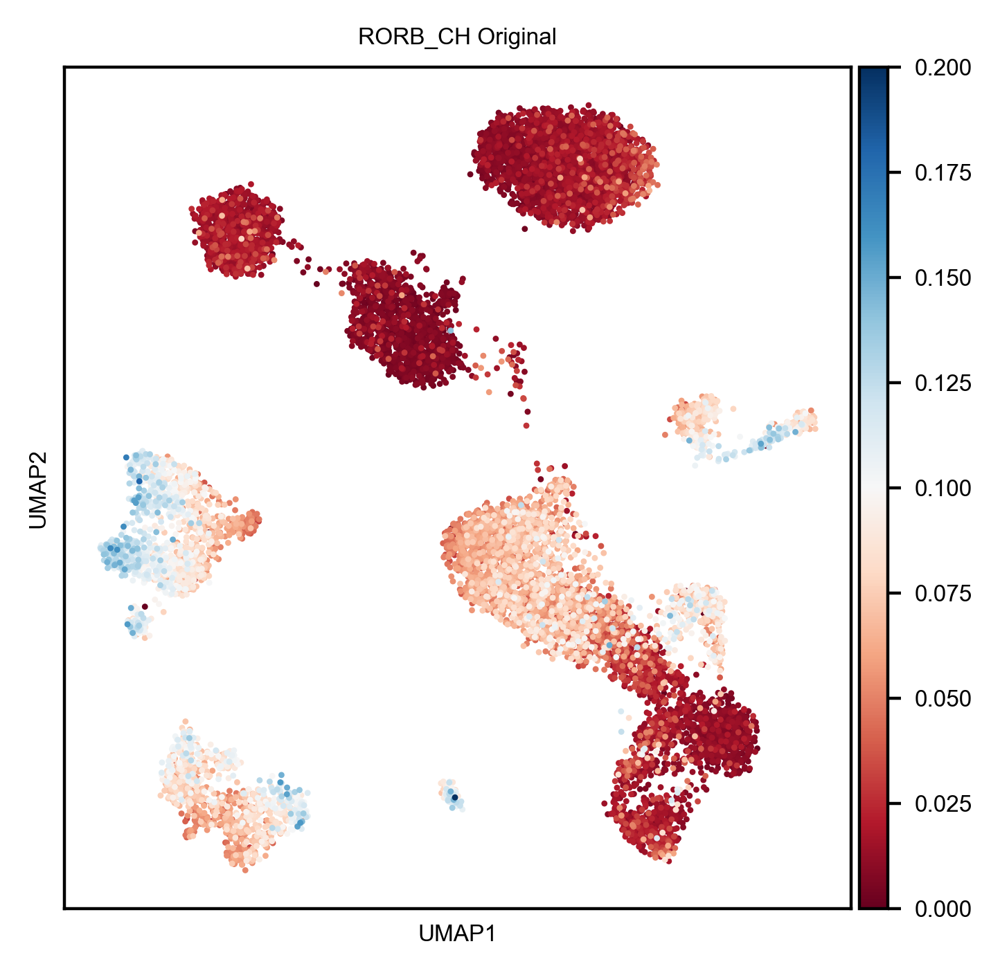

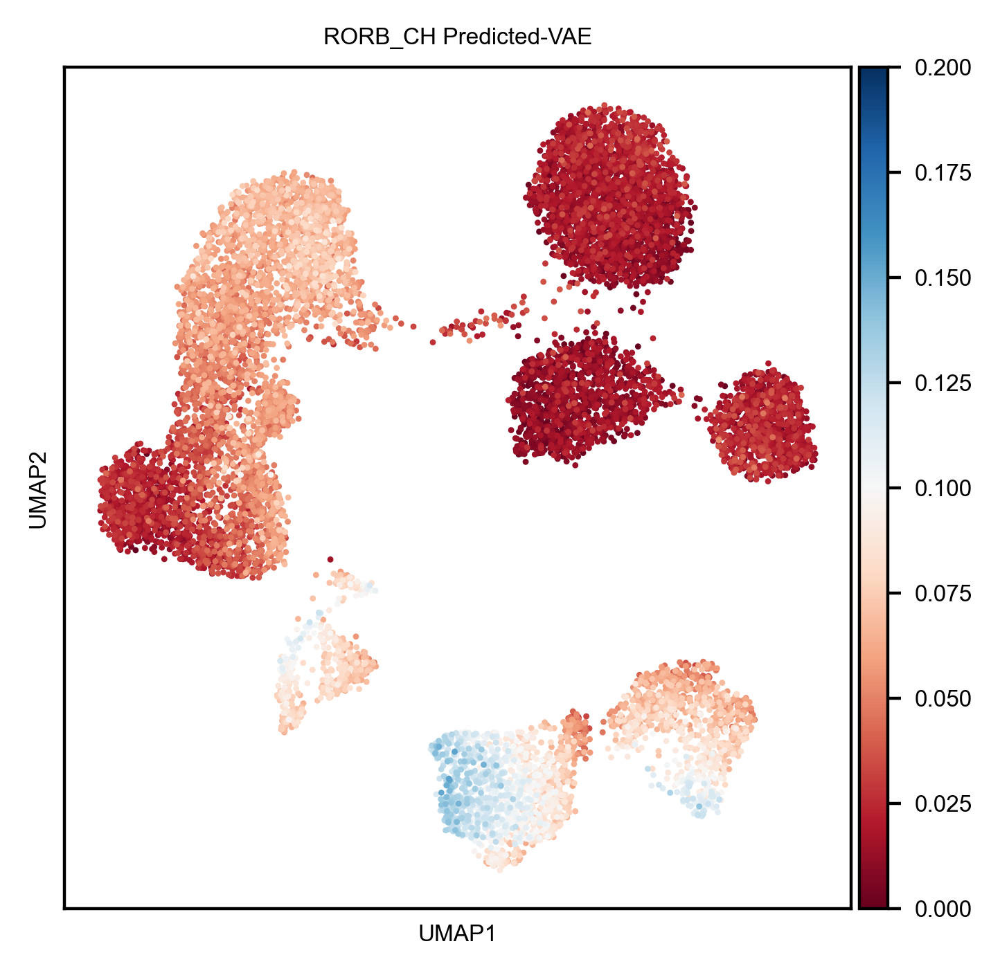

In [796]:
i = 'RORB_CH' # gene in astro cell type
sc.pl.umap(adata_HVG,color=i,vmax=0.2,vmin=0, title = 'RORB_CH Original')
sc.pl.umap(Predicted_VAE_Data,color=i,vmax=0.2, vmin=0, title = 'RORB_CH Predicted-VAE')

---

# <font color='Blue'>View the Original UMAP Representation and the Predicted Data UMAP Representation

---

In [797]:
print('predicted GMVAE adata post',Predicted_VAE_Data.obs['leiden'] )

predicted GMVAE adata post 20210111-1863-preAb-PFC-B12_A3     0
20210111-1863-preAb-PFC-B12_A23    4
20210111-1863-preAb-PFC-B12_B10    7
20210111-1863-preAb-PFC-B12_A1     1
20210111-1863-preAb-PFC-B12_A9     9
                                  ..
SRR9014785                         0
SRR9014797                         6
SRR9014803                         3
SRR9014807                         5
SRR9014813                         0
Name: leiden, Length: 11946, dtype: category
Categories (13, object): ['0', '1', '2', '3', ..., '9', '10', '11', '12']


In [ ]:
print('='*75)
print(Predicted_VAE_Data.obs )# Single cell, leiden assignment, and cell type label
print('='*75)

                                             L3 leiden           batch
20210111-1863-preAb-PFC-B12_A3            Astro      0  predicted data
20210111-1863-preAb-PFC-B12_A23             OPC      4  predicted data
20210111-1863-preAb-PFC-B12_B10  Exc-L4-5-FOXP2      7  predicted data
20210111-1863-preAb-PFC-B12_A1    Exc-L1-3-CUX2      1  predicted data
20210111-1863-preAb-PFC-B12_A9     Exc-DL-ASTN1      9  predicted data
...                                         ...    ...             ...
SRR9014785                                  ODC      0  predicted data
SRR9014797                       Inh-CGE-CHRNA2      6  predicted data
SRR9014803                       Exc-L1-3-NRXN2      3  predicted data
SRR9014807                                Astro      5  predicted data
SRR9014813                                  ODC      0  predicted data

[11946 rows x 3 columns]


/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


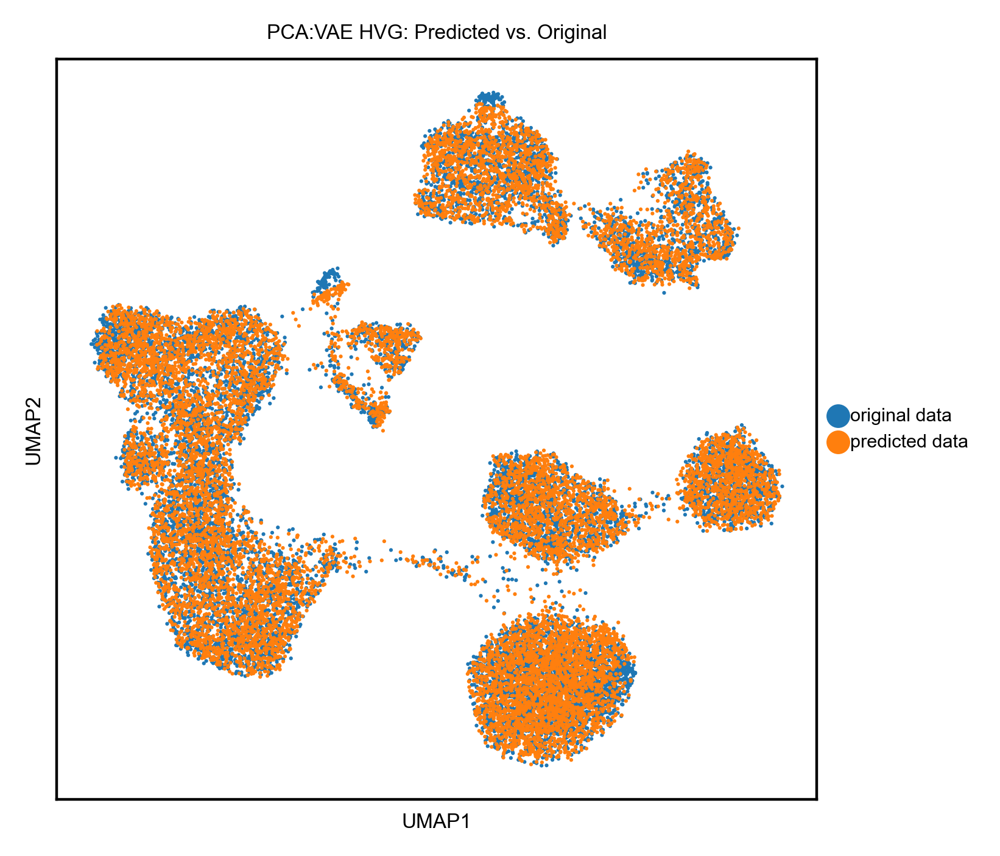

In [852]:
#--- Original Batch and Predicted batch for observations ---#
adata_HVG.obs['batch'] = 'original data' 
Predicted_VAE_Data.obs['batch'] = 'predicted data'
#--- Merge our data ---#
merged_adata = anndata.concat([adata_HVG, Predicted_VAE_Data], axis=0)
merged_adata.obs['cell_type'] = adata_HVG.obs['L3']
#--- Compute clustering metrics ---#
sc.tl.pca(merged_adata)
sc.pp.neighbors(merged_adata)
sc.tl.umap(merged_adata)
sc.tl.leiden(merged_adata)
#--- Visualize the original and predicted UMAP spaces ---#
sc.pl.umap(merged_adata, color=['batch'], legend_loc = 'right margin', title = 'PCA:VAE HVG: Predicted vs. Original')




---

# <font color='Red'> GMVAE on Prefrontal Cortex Highly Variable Genes</font>

---

In [915]:
encoded_train_HVG = autoencoder.predict(adata_HVG.X)
encoded_test_HVG = autoencoder.predict(adata_HVG.X)

374/374 [==============================] - 0s 746us/step


In [916]:
class GaussianMixtureVAE(scVAE):
    def __init__(self, latent_dim, original_dim, n_centroids, epochs, batch_size,
                 optimizer=keras.optimizers.Adam(learning_rate=0.005),
                 recon_loss_function=tf.keras.losses.MeanSquaredError()):
        super(GaussianMixtureVAE, self).__init__(latent_dim, original_dim, epochs, batch_size, optimizer, recon_loss_function)
        self.n_centroids = n_centroids
        self.pi = None
        self.mu_c = None
        self.var_c = None

        self.encoder = self.generate_encoder()
        self.encoder.compile(optimizer=optimizer, loss=self.vae_loss)
        # Define the construction of the decoder with optimizer and loss
        self.decoder = self.generate_decoder()
        self.decoder.compile(optimizer=optimizer, loss=self.vae_loss)
        # Construction of vae loss 

    def vae_loss(self, y_true, y_pred):
        recon_loss, kl_loss = super().vae_loss(y_true, y_pred)

        if self.pi is None or self.mu_c is None or self.var_c is None:
            self.pi = K.ones((self.n_centroids,)) / self.n_centroids
            self.mu_c = K.zeros((self.latent_dim, self.n_centroids))
            self.var_c = K.ones((self.latent_dim, self.n_centroids))

        return recon_loss , kl_loss + self.gmm_kl_loss()
    
    def gmm_kl_loss(self):
        var_c_eps = K.clip(self.var_c, K.epsilon(), None)
        logvar_c = K.log(var_c_eps)
        kl_loss = -0.5 * K.mean(K.sum(1 + logvar_c - K.square(self.mu_c) - var_c_eps, axis=-1), axis=0)
        return kl_loss
    def generate_encoder(self):
        Encoder_Inputs = keras.Input(shape=(self.original_dim,))
        Hidden = layers.Dense(300, activation = 'relu')(Encoder_Inputs)
        Batch_Norm = layers.BatchNormalization()(Hidden)
        Hidden_1 = layers.Dense(200, activation='relu')(Batch_Norm)
        bn1 = layers.BatchNormalization()(Hidden_1)
        layer_1 = layers.Dense(180, activation = 'relu')(bn1)
        bnn = layers.BatchNormalization()(layer_1)
        vae_mu = layers.Dense(self.latent_dim, activation='linear')(bnn)
        vae_sigma = layers.Dense(self.latent_dim, activation='linear')(bnn)
        return keras.Model(Encoder_Inputs, [vae_mu, vae_sigma], name='Encoder')

    def perform_sampling(self, args):
        vae_mu, vae_logvar = args
        eps = K.random_normal(shape=(K.shape(vae_mu)[0], K.shape(vae_mu)[1]), mean=0., stddev=1., seed=42)
        return vae_mu + K.exp(0.5 * vae_logvar) * eps

    def generate_decoder(self):
        latent_input = keras.Input(shape=(self.latent_dim,))
        lay2 = layers.Dense(64, activation = 'relu')(latent_input)
        bn = layers.BatchNormalization()(lay2)
        hid = layers.Dense(128, activation = 'relu')(bn)
        bn11 = layers.BatchNormalization()(hid)
        out_prediction = layers.Dense(self.original_dim, activation='linear', name='Out_Prediction')(bn11)
        return keras.Model(latent_input, out_prediction, name='decoder')

    def get_gamma(self, z):
        z = K.expand_dims(z, axis=2)
        pi = K.repeat_elements(K.expand_dims(self.pi, axis=0), K.shape(z)[0], axis=0)
        mu_c = K.repeat_elements(K.expand_dims(self.mu_c, axis=0), K.shape(z)[0], axis=0)
        var_c = K.repeat_elements(K.expand_dims(self.var_c, axis=0), K.shape(z)[0], axis=0)
        p_c_z = K.exp(K.log(pi) - K.sum(0.5 * K.log(2 * math.pi * var_c) + K.square(z - mu_c) / (2 * var_c), axis=1))
        gamma = p_c_z / K.sum(p_c_z, axis=1, keepdims=True)
        return gamma, mu_c, var_c, pi
#--- Set the training parameters and intialize the model ---# 
latent_dim =165
original_dim = encoded_train_HVG.shape[1]
n_centroids = 48  
epochs =  11 
batch_size = 15
gmvae_HVG = GaussianMixtureVAE(latent_dim, original_dim, n_centroids, epochs, batch_size)
train_losses_HVG, val_losses_HVG = gmvae_HVG.train(encoded_train_HVG, encoded_test_HVG)

Epoch 1/11
Train loss: 0.0063, Val loss: 0.0008
Epoch 2/11
Train loss: 0.0009, Val loss: 0.0007
Epoch 3/11
Train loss: 0.0007, Val loss: 0.0005
Epoch 4/11
Train loss: 0.0005, Val loss: 0.0002
Epoch 5/11
Train loss: 0.0004, Val loss: 0.0009
Epoch 6/11
Train loss: 0.0004, Val loss: 0.0002
Epoch 7/11
Train loss: 0.0003, Val loss: 0.0001
Epoch 8/11
Train loss: 0.0003, Val loss: 0.0003
Epoch 9/11
Train loss: 0.0003, Val loss: 0.0001
Epoch 10/11
Train loss: 0.0003, Val loss: 0.0002
Epoch 11/11
Train loss: 0.0003, Val loss: 0.0001


---

# <font color='Red'>Visualize the Predicted Data and the Latent Space for GMVAE</font>

---

374/374 [==============================] - 0s 397us/step


/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


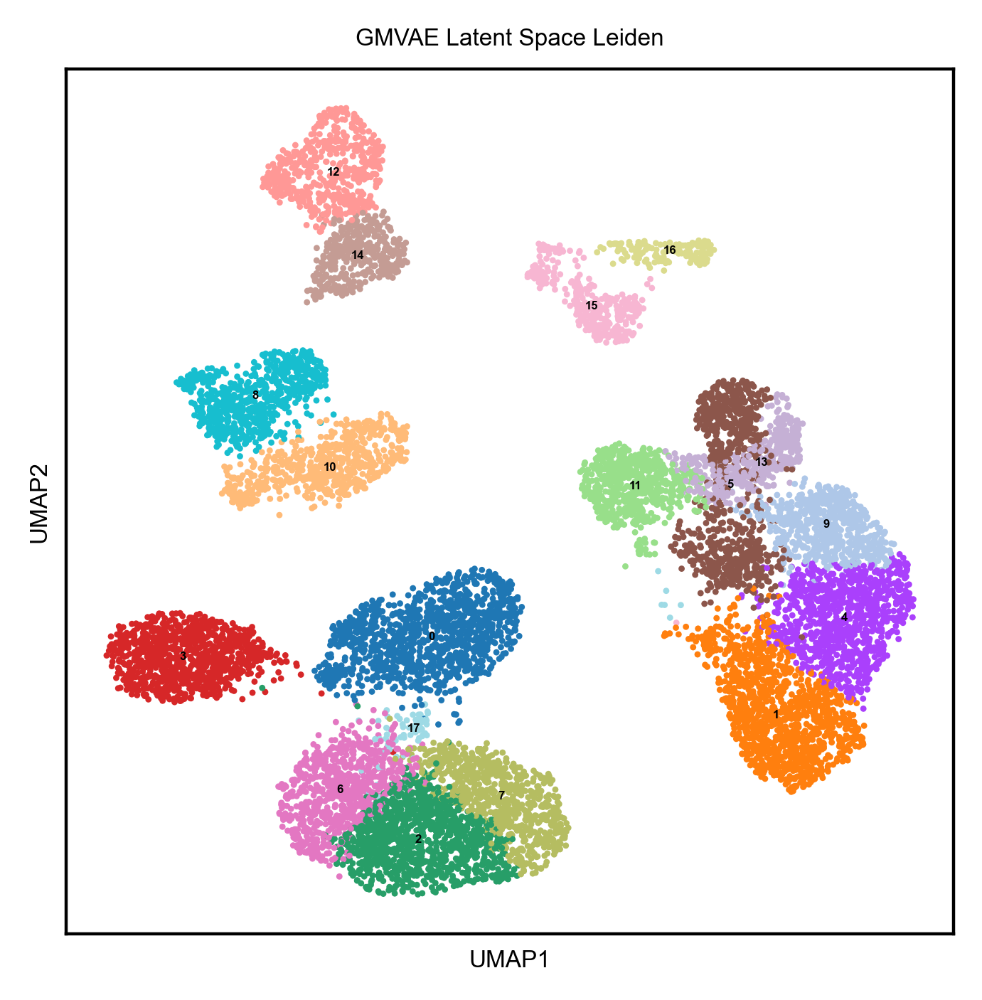

/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


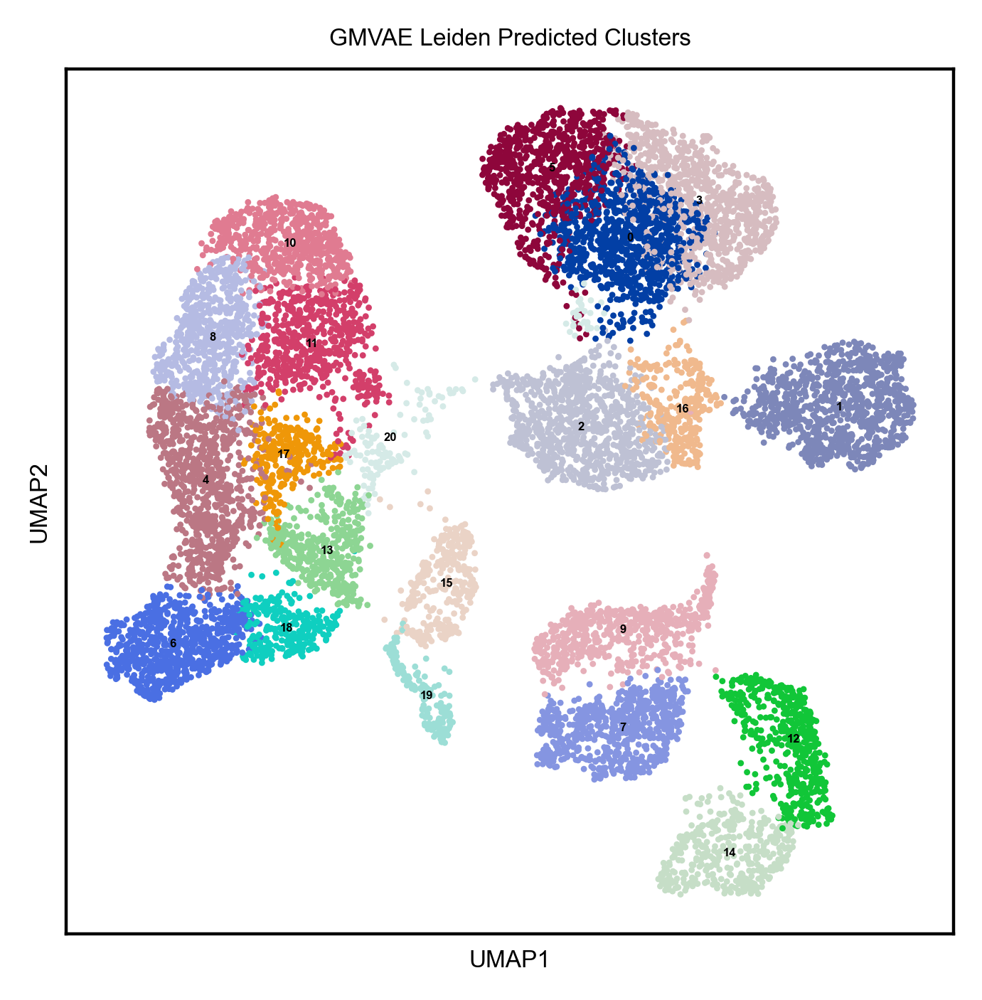

/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


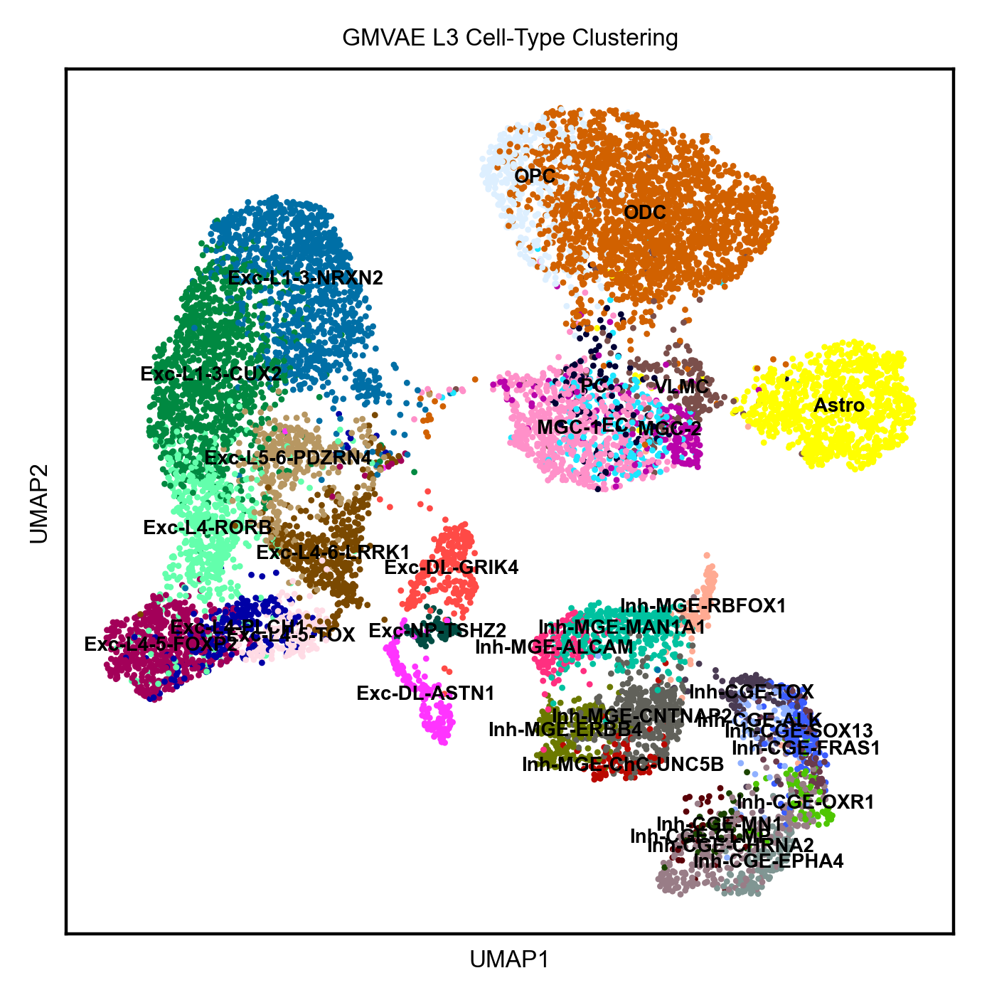

In [917]:
#--- View the predicted dataframe for GMVAE---#
Predicted_GMVAE_Data = sc.AnnData(pd.DataFrame(gmvae_HVG.predict(adata_HVG.X), columns=adata_HVG.var_names, index=adata_HVG.obs_names))
Predicted_GMVAE_Data.obs['L3'] = adata_HVG.obs['L3']
#--- Get the latent space ---#
Latent_Space_GMVAE = sc.AnnData(pd.DataFrame(gmvae_HVG.encoder.predict(adata_HVG.X)[0]))
sc.tl.pca(Latent_Space_GMVAE)

sc.pp.neighbors(Latent_Space_GMVAE)
sc.tl.umap(Latent_Space_GMVAE)
sc.tl.leiden(Latent_Space_GMVAE)
#--- Run Clustering Metrics ---#
sc.tl.pca(Predicted_GMVAE_Data)
sc.pp.neighbors(Predicted_GMVAE_Data)
sc.tl.umap(Predicted_GMVAE_Data)
sc.tl.leiden(Predicted_GMVAE_Data)
#--- Visualize the Results ---#
with plt.rc_context({'figure.figsize': (4, 4)}):
     sc.pl.umap(Latent_Space_GMVAE,color =['leiden'], legend_loc = 'on data', title = 'GMVAE Latent Space Leiden' , legend_fontsize =3)
     sc.pl.umap(Predicted_GMVAE_Data, color = ['leiden'], legend_loc = 'on data', title = 'GMVAE Leiden Predicted Clusters', legend_fontsize=3)
     sc.pl.umap(Predicted_GMVAE_Data, color=['L3'], legend_loc='on data', legend_fontsize=5, title='GMVAE L3 Cell-Type Clustering')

    

---

# <font color = 'Red'> Get the ARI score for the Predicted Data via leiden
    
---

/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


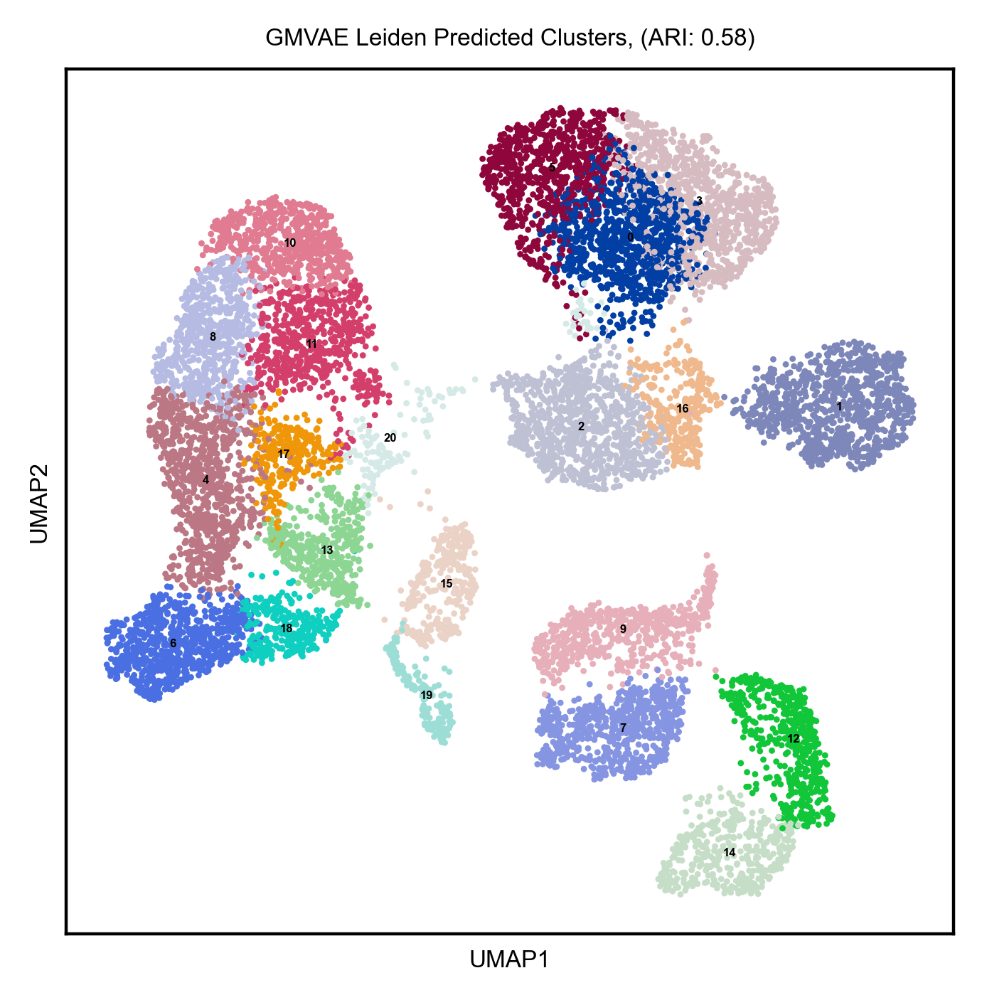

In [918]:
#--- Get the labels for leiden assignments ---#
Original_HVG_leiden_Assignments = adata_HVG.obs['leiden']
GMVAE_HVG_Predicted_leiden_Assignments = Predicted_GMVAE_Data.obs['leiden']
#--- Get the ARI score ---#

ARI_Score_GMVAE_HVG = adjusted_rand_score(Original_HVG_leiden_Assignments,GMVAE_HVG_Predicted_leiden_Assignments)

with plt.rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(Predicted_GMVAE_Data, color=['leiden'], title=f'GMVAE Leiden Predicted Clusters, (ARI: {ARI_Score_GMVAE_HVG:.2f})', legend_loc='on data', legend_fontsize=3)


---

# <font color='Red'> Create a Comparison Dataframe for Original and Reconstructed Data methylation levels</font>

---

In [919]:
adata_HVG.obs['L3'][1:20]

20210111-1863-preAb-PFC-B12_A23                OPC
20210111-1863-preAb-PFC-B12_B10     Exc-L4-5-FOXP2
20210111-1863-preAb-PFC-B12_A1       Exc-L1-3-CUX2
20210111-1863-preAb-PFC-B12_A9        Exc-DL-ASTN1
20210111-1863-preAb-PFC-B12_B13     Exc-L4-5-FOXP2
20210111-1863-preAb-PFC-B12_B15              Astro
20210111-1863-preAb-PFC-B12_A22                ODC
20210111-1863-preAb-PFC-B12_A4      Exc-L4-5-FOXP2
20210111-1863-preAb-PFC-B12_A12        Exc-L4-RORB
20210111-1863-preAb-PFC-B12_A20              Astro
20210111-1863-preAb-PFC-B12_A13     Exc-L4-5-FOXP2
20210111-1863-preAb-PFC-B12_A19      Exc-L1-3-CUX2
20210111-1863-preAb-PFC-B12_A16     Inh-MGE-MAN1A1
20210111-1863-preAb-PFC-B12_B3        Inh-CGE-CLMP
20210111-1863-preAb-PFC-B12_A8         Exc-L4-RORB
20210111-1863-preAb-PFC-B12_A2      Exc-L1-3-NRXN2
20210111-1863-preAb-PFC-B12_A11    Exc-L5-6-PDZRN4
20210111-1863-preAb-PFC-B12_B12      Inh-MGE-ALCAM
20210111-1863-preAb-PFC-B12_C13    Exc-L5-6-PDZRN4
Name: L3, dtype: category
Categ

(0.0, 100.0)

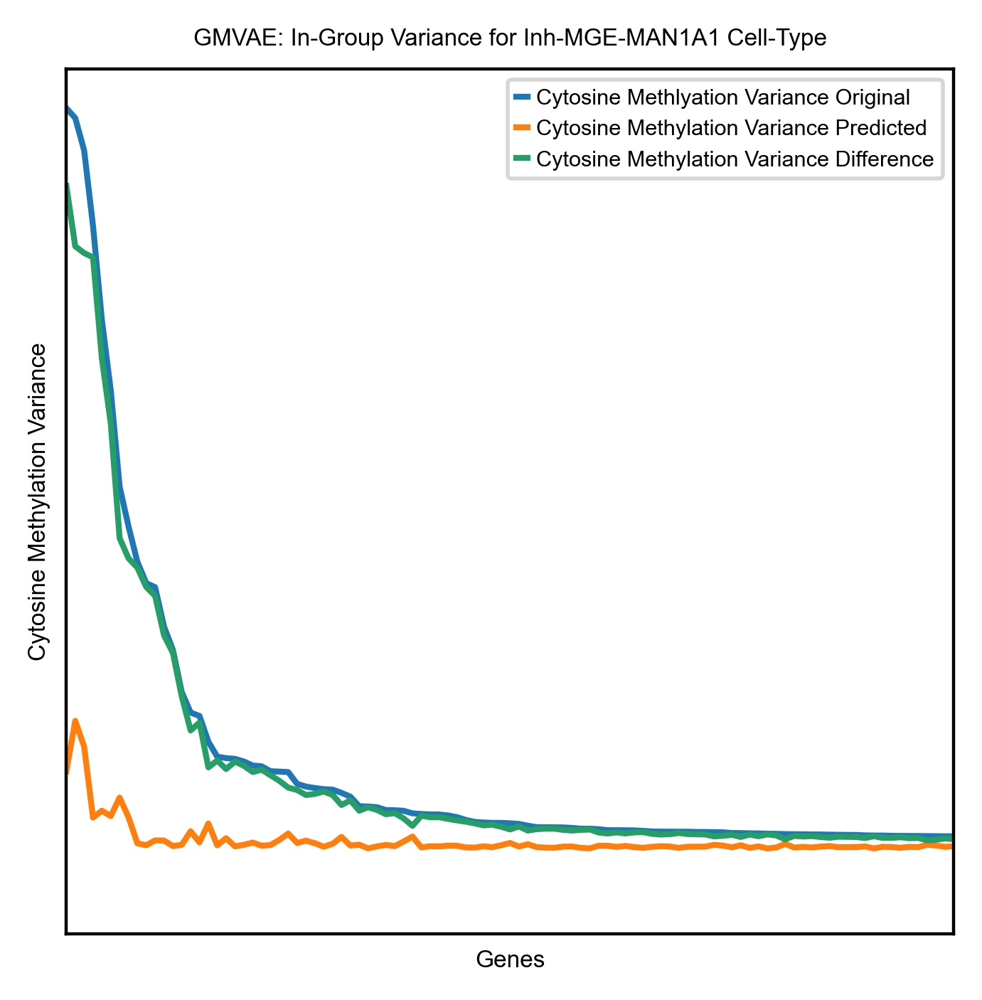

In [920]:

#--- In group variance of the Astro cell-type ---#
GMVAE_var=pd.DataFrame(adata_HVG[adata_HVG.obs['L3'].isin(['Inh-MGE-MAN1A1'])].to_df().var()) # Get the genes for Astro cell type
GMVAE_var.columns=['original'] # In our dataframe create a column called original
#--- Create the Predcited Column which are the values for Astro cell type by gene from autoencoder ---#
GMVAE_var['Predicted']=pd.DataFrame( Predicted_GMVAE_Data[ Predicted_GMVAE_Data.obs['L3'].isin(['Inh-MGE-MAN1A1'])].to_df().var())[0]
#--- Create the difference column which subtracts the original methylation values from predicted to show noise reduction ---#
GMVAE_var['Difference']=GMVAE_var['original']-GMVAE_var['Predicted']
#--- Sort our dataframe by the difference column ---#
GMVAE_var=GMVAE_var.sort_values('original',ascending=False)

sns.lineplot(GMVAE_var['original'], label = 'Cytosine Methlyation Variance Original')
sns.lineplot(GMVAE_var['Predicted'], label = 'Cytosine Methylation Variance Predicted')
sns.lineplot(GMVAE_var['Difference'], label = 'Cytosine Methylation Variance Difference')
plt.title('GMVAE: In-Group Variance for Inh-MGE-MAN1A1 Cell-Type')
plt.xlabel('Genes')
plt.ylabel('Cytosine Methylation Variance')
plt.xticks([])
plt.yticks([])
plt.legend()
plt.xlim(0, 100)

In [921]:
GMVAE_Exc_L4_RORB

,original,Predicted,Difference
region,,,
PROX1_CG,0.040465,0.029237,0.011227
HRH2_CG,0.037446,0.020726,0.016720
MN1_CG,0.035370,0.027197,0.008173
TLE4_CG,0.030821,0.028930,0.001891
LRIG1_CG,0.021671,0.015773,0.005898
...,...,...,...
AGBL4_CH,0.000036,0.000010,0.000025
ATRNL1_CH,0.000034,0.000013,0.000021
PTPRD_CH,0.000030,0.000018,0.000011


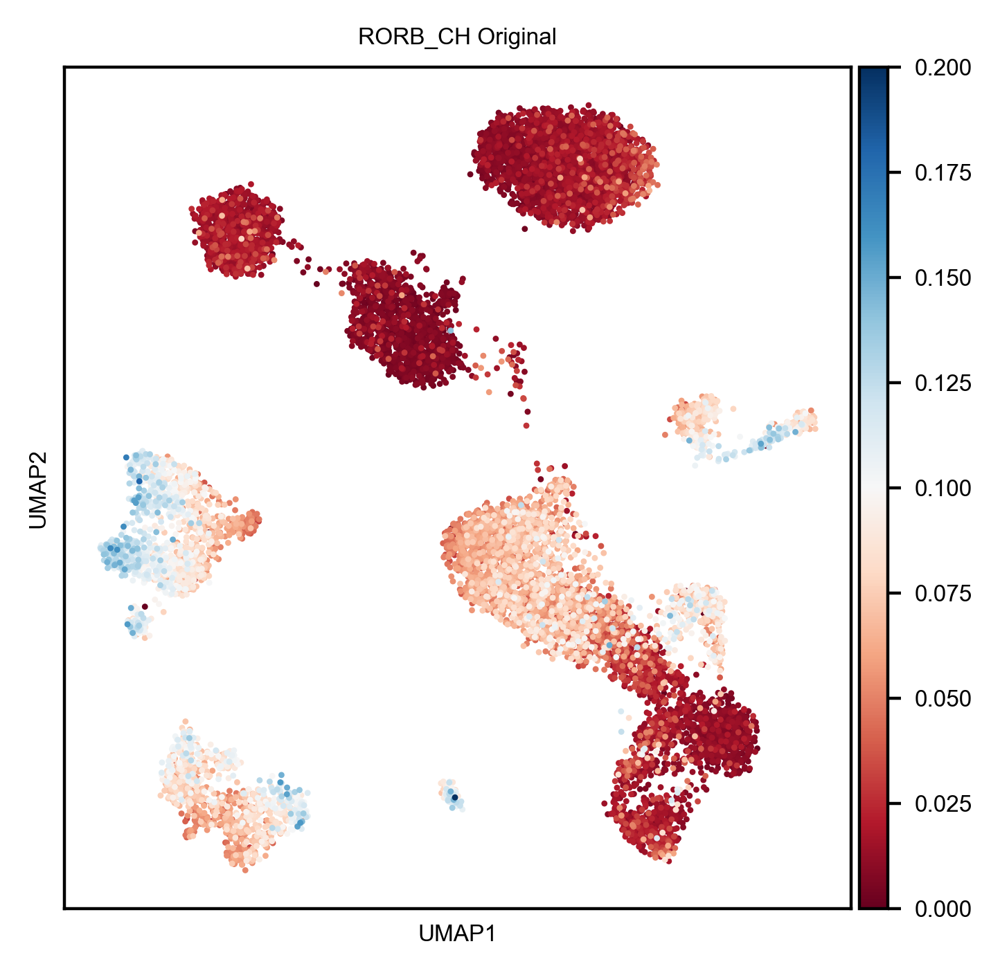

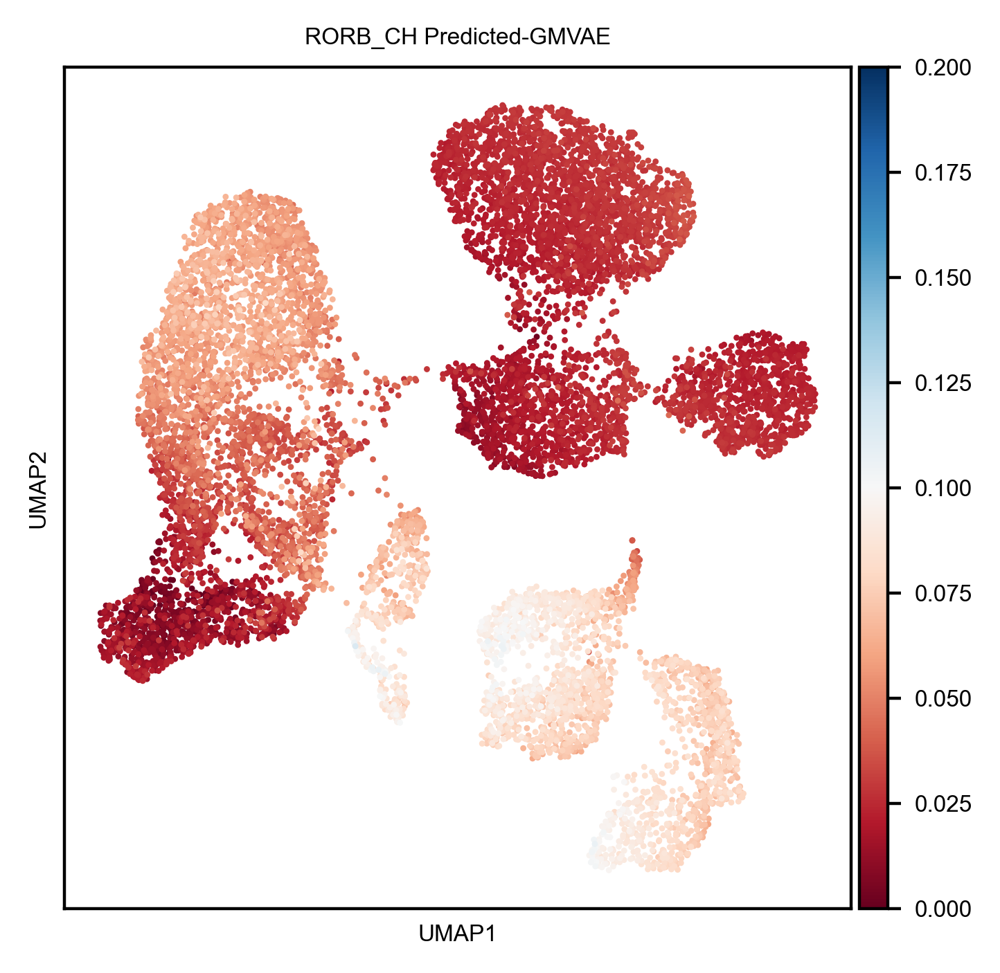

In [922]:
i = 'RORB_CH' # gene in astro cell type
sc.pl.umap(adata_HVG,color=i,vmax=0.2,vmin=0, title = 'RORB_CH Original')
sc.pl.umap(Predicted_GMVAE_Data,color=i,vmax=0.2, vmin=0, title='RORB_CH Predicted-GMVAE')

---

# <font color='Red'>View the Original UMAP Representation and the Predicted Data UMAP Representation

---

In [923]:
print('='*75)
print(Predicted_GMVAE_Data.obs )# Single cell, leiden assignment, and cell type label
print('='*75)

                                             L3 leiden
20210111-1863-preAb-PFC-B12_A3            Astro      0
20210111-1863-preAb-PFC-B12_A23             OPC      5
20210111-1863-preAb-PFC-B12_B10  Exc-L4-5-FOXP2      6
20210111-1863-preAb-PFC-B12_A1    Exc-L1-3-CUX2      8
20210111-1863-preAb-PFC-B12_A9     Exc-DL-ASTN1     19
...                                         ...    ...
SRR9014785                                  ODC      0
SRR9014797                       Inh-CGE-CHRNA2     14
SRR9014803                       Exc-L1-3-NRXN2     10
SRR9014807                                Astro      1
SRR9014813                                  ODC      3

[11946 rows x 2 columns]


/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/huntercarroll/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


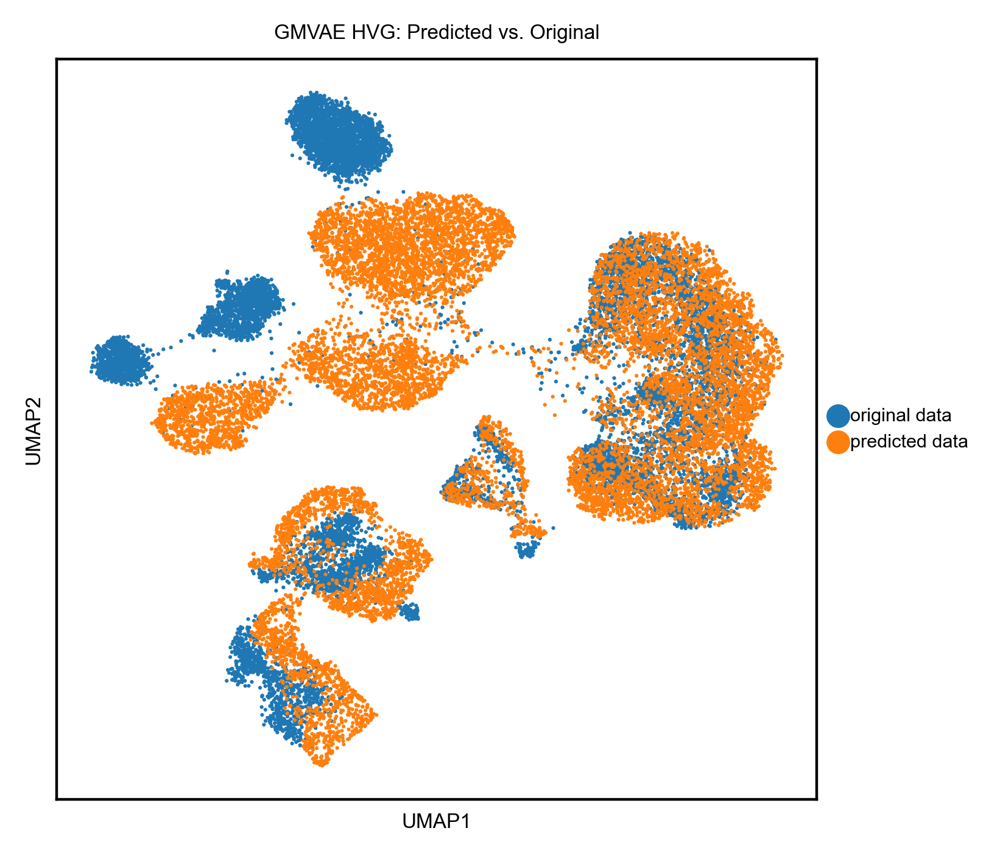

In [924]:
#--- Original Batch and Predicted batch for observations ---#
adata_HVG.obs['batch'] = 'original data' 
Predicted_GMVAE_Data.obs['batch'] = 'predicted data'
#--- Merge our data ---#
merged_adata = anndata.concat([adata_HVG, Predicted_GMVAE_Data], axis=0)
merged_adata.obs['cell_type'] = adata_HVG.obs['L3']
#--- Compute clustering metrics ---#
sc.tl.pca(merged_adata)
sc.pp.neighbors(merged_adata)
sc.tl.umap(merged_adata)
sc.tl.leiden(merged_adata)
#--- Visualize the original and predicted UMAP spaces ---#
sc.pl.umap(merged_adata, color=['batch'], legend_loc = 'right margin', title = 'GMVAE HVG: Predicted vs. Original')



# Last performance metrics

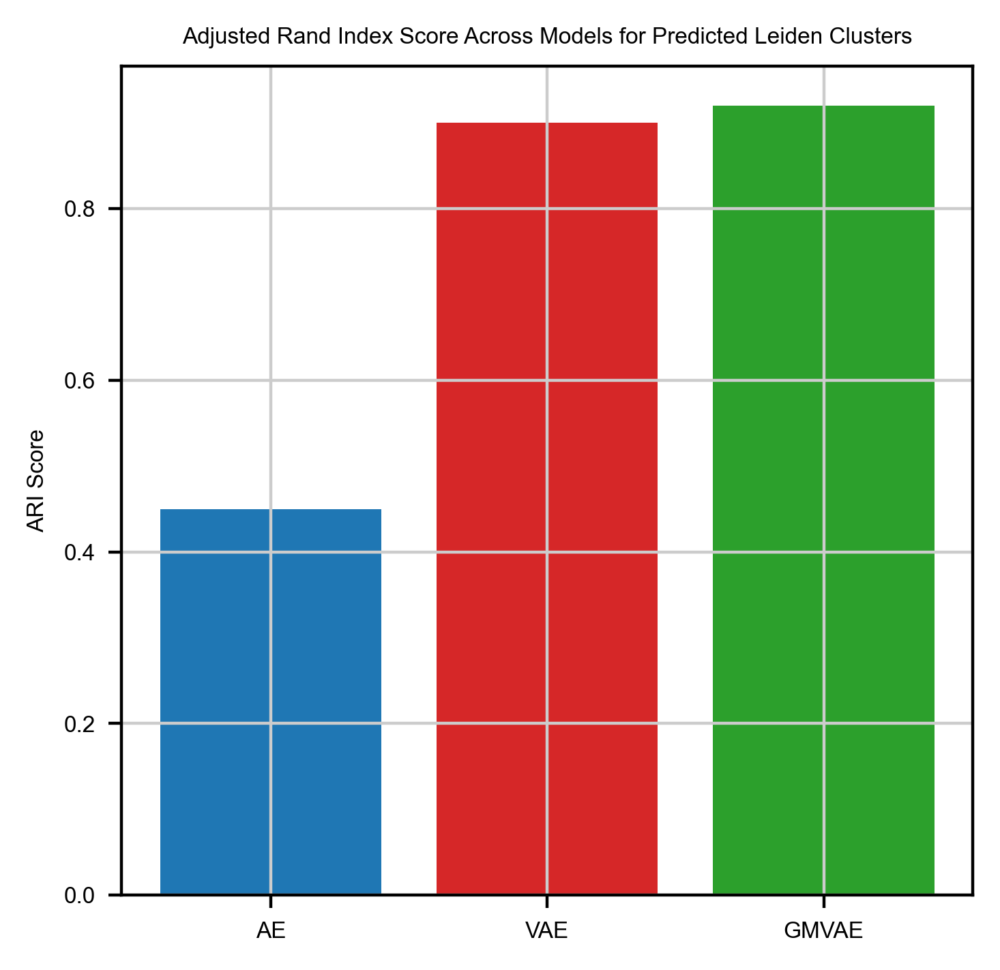

In [939]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt

# Data
ARI_Score = np.array([0.45, 0.90, 0.92])
Model = ['AE', 'VAE', 'GMVAE']

# Color scheme (using HEX color codes)
colors = ['#1f77b4', '#d62728', '#2ca02c']

# Create the bar plot with the specified color scheme
plt.bar(Model, ARI_Score, color=colors)
plt.title('Adjusted Rand Index Score Across Models for Predicted Leiden Clusters')
plt.ylabel('ARI Score')

# Show the plot
plt.show()


(0.0, 100.0)

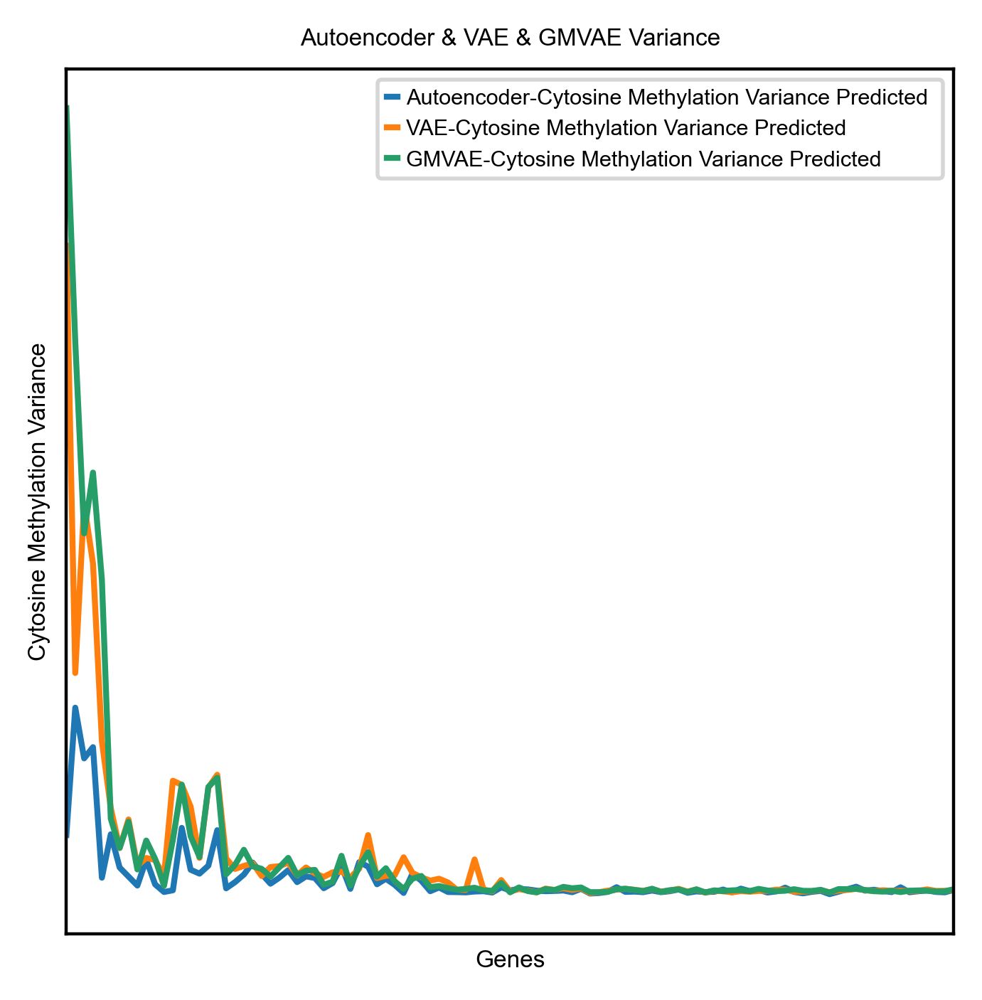

In [903]:
sns.lineplot(Autoencoder_var['Predicted'], label ='Autoencoder-Cytosine Methylation Variance Predicted ')
sns.lineplot(VAE_var['Predicted'], label = 'VAE-Cytosine Methylation Variance Predicted')
sns.lineplot(GMVAE_var['Predicted'], label = 'GMVAE-Cytosine Methylation Variance Predicted')
plt.title('Autoencoder & VAE & GMVAE Variance')
plt.xlabel('Genes')
plt.ylabel('Cytosine Methylation Variance')
plt.xticks([])
plt.yticks([])
plt.legend()
plt.xlim(0, 100)